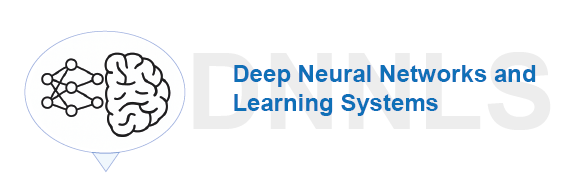

# Final assessment For Arinze Uwazurike - Main Notebook
---

**Introduction:**

In this notebook you will find a baseline, functional architecture for your assessment task.

In [1]:
#!pip install torchinfo
#!pip install clip
#!pip install evaluate
#!pip install rouge_score
#!pip uninstall -y transformers
#!pip install transformers==4.38.2

  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-0.2.0-py3-none-any.whl size=6989 sha256=9c5320dce4b6f20e039e83541057616793cdfb333178d0dd3b64ce52d844f78a
  Stored in directory: /root/.cache/pip/wheels/6c/fd/54/9d4e15cf829b871199a7cd3597e869a514d1624a0a43076896
Successfully built clip
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for rouge_score: filename=rouge_score-0.1.2-py3-none-any.whl size=24934 sha256=ffc7509782a5acbf724d18dcc15ee844aabe5ba888f8ae32fe078ccc98d323a2
  Stored in directory: /root/.cache/pip/wheels/85/9d/af/01feefbe7d55ef5468796f0c68225b6788e85d9d0a281e7a70
Successfully built rouge_score
Found existing installation: transformers 5.0.0
Uninstalling transformers-5.0.0:
  Successfully uninstalled transformers-5.0.0
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.7/130.7 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.5/8.5 MB 93.

In [1]:
# @title Importing the necessary libraries

import torch
import torch.nn as nn
import torch.nn.functional as F
import clip
from bs4 import BeautifulSoup
import re
import matplotlib.pyplot as plt
import numpy as np
import os
from nltk.translate.bleu_score import sentence_bleu
import json
import pandas as pd
from torchinfo import summary
from transformers import CLIPProcessor, CLIPModel, RobertaModel, RobertaTokenizer, CLIPConfig
import evaluate
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

from datasets.fingerprint import random
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as transforms
import torchvision.models as models
import torchvision.transforms.functional as FT

from transformers import BertTokenizer
import gc
import seaborn as sns
import textwrap

C:\Users\dell 5590 i7\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# **Chapter 1: The data preparation**


---



First we need to activate our google drive so that we can save out data permanently.

## 1.1 Loading and saving data

In [3]:

# This will prompt you to authorize Google Drive access
from google.colab import drive
drive.mount('/content/drive')
def save_checkpoint_to_drive(model, optimizer, epoch, loss, filename="roberta_clip_checkpoint.pth"):
    """
    Saves the checkpoint directly to a specified folder in your mounted Google Drive.
    """
    # 1. Define the full Google Drive path
    # 'DL_Checkpoints' is the folder you want to save to inside your Drive
    drive_folder = '/content/drive/MyDrive/DL_Checkpoints'

    # Ensure the directory exists before attempting to save
    os.makedirs(drive_folder, exist_ok=True)

    # 2. Combine the folder and the filename
    full_path = os.path.join(drive_folder, filename)

    # 3. Create the checkpoint dictionary
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss,
    }

    # 4. Save the dictionary to the Google Drive path
    torch.save(checkpoint, full_path)
    print(f"Checkpoint saved to Google Drive: {full_path} at epoch {epoch}")


def load_checkpoint_from_drive(model, optimizer=None, filename="roberta_clip_checkpoint.pth"):
    """
    Loads a checkpoint from your Google Drive folder into the model and optimizer (if provided).
    """
    # Define the same Google Drive folder path
    drive_folder = '/content/drive/MyDrive/DL_Checkpoints'
    full_path = os.path.join(drive_folder, filename)

    # Check if the checkpoint file exists
    if not os.path.exists(full_path):
        raise FileNotFoundError(f"Checkpoint file not found: {full_path}")

    # Load the checkpoint
    checkpoint = torch.load(full_path, map_location=torch.device('cpu'))  # use cuda if available

    # Restore model state
    model.load_state_dict(checkpoint['model_state_dict'])

    # Restore optimizer state (if provided)
    if optimizer is not None:
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

    # Extract metadata
    epoch = checkpoint.get('epoch', 0)
    loss = checkpoint.get('loss', None)

    print(f"Checkpoint loaded from: {full_path} (epoch {epoch})")

    return model, optimizer, epoch, loss

Mounted at /content/drive


We need to define a couple of functions to make our life easier. Feel free to tweak those functions:

In [2]:
from src.final_training import (N_EPOCHS, emb_dim, latent_dim, num_layers, lr, max_seq_len, batch_size, dropout)
N_EPOCHS = N_EPOCHS
emb_dim = emb_dim
latent_dim = latent_dim
num_layers = num_layers
lr = lr
max_seq_len = max_seq_len
batch_size = batch_size
dropout = dropout

In [3]:
print("Epochs:", N_EPOCHS)
print("Emb Dim:", emb_dim)
print("Latent Dim:", latent_dim)
print("Number of layers:", num_layers)
print("Learning rate:", lr)
print("Max Sequence length:", max_seq_len)
print("Batch Size:", batch_size)
print("Dropout:", dropout)

Epochs: 15
Emb Dim: 128
Latent Dim: 128
Number of layers: 2
Learning rate: 0.0001
Max Sequence length: 120
Batch Size: 16
Dropout: 0.1


In [4]:
# @title Functions to show images and process data
"""
This cell provides essential data processing and visualization tools.
1. `parse_gdi_text`: Parses the raw "GDI" (Graph-Text-Interleaved) format from the dataset into a structured dictionary containing objects, actions, and locations.
2. `show_image`: A helper using matplotlib to display pytorch tensors as images, handling optional de-normalization.
"""

# This function just extracts the tags from the text, don't get distracted by it.
# I changed this function a bit to fix some bugs
def parse_gdi_text(text):
    """Parse GDI formatted text into structured data"""
    soup = BeautifulSoup(text, 'html.parser')
    images = []

    for gdi in soup.find_all('gdi'):
        # Debug: print what BeautifulSoup sees

        # Method 1: Try to get image attribute directly
        image_id = None
        if gdi.attrs:
            # Check for attributes like 'image1', 'image2', etc.
            for attr_name, attr_value in gdi.attrs.items():
                if 'image' in attr_name.lower():
                    image_id = attr_name.replace('image', '')
                    break

        # Method 2: Extract from the tag string using regex
        if not image_id:
            tag_str = str(gdi)
            match = re.search(r'<gdi\s+image(\d+)', tag_str)
            if match:
                image_id = match.group(1)

        # Method 3: Fallback - use sequential numbering
        if not image_id:
            image_id = str(len(images) + 1)

        content = gdi.get_text().strip()

        # Extract tagged elements using BeautifulSoup directly
        objects = [obj.get_text().strip() for obj in gdi.find_all('gdo')]
        actions = [act.get_text().strip() for act in gdi.find_all('gda')]
        locations = [loc.get_text().strip() for loc in gdi.find_all('gdl')]

        images.append({
            'image_id': image_id,
            'description': content,
            'objects': objects,
            'actions': actions,
            'locations': locations,
            'raw_text': str(gdi)
        })

    return images

# This is an utility function to show images.
# Why do we need to do all this?
def show_image(ax, image, de_normalize = False, img_mean = None, img_std = None):
  """
  De-normalize the image (if necessary) and show image
  """
  if de_normalize:
    new_mean = -img_mean/img_std
    new_std = 1/img_std

    image = transforms.Normalize(
        mean=new_mean,
        std=new_std
    )(image)
  ax.imshow(image.permute(1, 2, 0))

In [5]:
# @title CoT grounding helpers (added)
"""
This cell contains helper functions to parse the "Chain-of-Thought" (CoT) annotations provided in the dataset.
1. `parse_cot_grounding`: Extracts bounding boxes for characters and objects from the CoT markdown tables.
2. `crop_and_resize`: Crops an image region based on a bounding box and resizes it to a fixed size (60x125).
3. `pick_reid_pair`: Selects a pair of bounding boxes for the same entity across different frames to support Re-Identification (ReID) learning.
4. `extract_cot_text_for_frame`: Extracts the text reasoning corresponding to a specific frame.
"""

import random
import re
from typing import Dict, Any, List, Optional, Tuple

def _parse_markdown_table(block: str) -> List[Dict[str, str]]:
    lines = [l.rstrip() for l in block.splitlines()]
    table_lines = [l for l in lines if l.strip().startswith("|")]
    if len(table_lines) < 3:
        return []
    header_line = table_lines[0]
    data_lines = table_lines[2:]
    headers = [h.strip() for h in header_line.strip("|").split("|")]
    rows = []
    for line in data_lines:
        if not line.strip().startswith("|"):
            break
        cols = [c.strip() for c in line.strip("|").split("|")]
        if len(cols) != len(headers):
            continue
        rows.append(dict(zip(headers, cols)))
    return rows

def parse_cot_grounding(chain_of_thought: str) -> Dict[int, Dict[str, Any]]:
    """Parse StoryReasoning-style CoT markdown into per-frame bbox annotations."""
    frames: Dict[int, Dict[str, Any]] = {}
    img_pattern = re.compile(r"^##\s*Image\s+(\d+)", flags=re.MULTILINE)
    matches = list(img_pattern.finditer(chain_of_thought or ""))

    for i, m in enumerate(matches):
        img_idx = int(m.group(1)) - 1
        start = m.end()
        end = matches[i + 1].start() if (i + 1 < len(matches)) else len(chain_of_thought)
        section = (chain_of_thought or "")[start:end]

        frames[img_idx] = {"characters": [], "objects": []}

        char_match = re.search(r"###\s*Characters(.*?)(?=\n###|\n##|$)", section, flags=re.DOTALL)
        if char_match:
            for row in _parse_markdown_table(char_match.group(1)):
                cid = row.get("Character ID", "").strip()
                bbox_str = row.get("Bounding Box", "").strip()
                if cid and bbox_str:
                    try:
                        x1, y1, x2, y2 = [int(v) for v in bbox_str.split(",")]
                        frames[img_idx]["characters"].append({"id": cid, "bbox": [x1, y1, x2, y2]})
                    except Exception:
                        pass

        obj_match = re.search(r"###\s*Objects(.*?)(?=\n###|\n##|$)", section, flags=re.DOTALL)
        if obj_match:
            for row in _parse_markdown_table(obj_match.group(1)):
                oid = row.get("Object ID", "").strip()
                bbox_str = row.get("Bounding Box", "").strip()
                if oid and bbox_str:
                    try:
                        x1, y1, x2, y2 = [int(v) for v in bbox_str.split(",")]
                        frames[img_idx]["objects"].append({"id": oid, "bbox": [x1, y1, x2, y2]})
                    except Exception:
                        pass
    return frames

def _clamp_bbox(x1, y1, x2, y2, W, H):
    x1 = max(0, min(x1, W - 1))
    x2 = max(0, min(x2, W - 1))
    y1 = max(0, min(y1, H - 1))
    y2 = max(0, min(y2, H - 1))
    if x2 <= x1:
        x2 = min(W - 1, x1 + 1)
    if y2 <= y1:
        y2 = min(H - 1, y1 + 1)
    return x1, y1, x2, y2

def crop_and_resize(pil_img, bbox, out_hw=(60, 125)):
    x1, y1, x2, y2 = bbox
    W, H = pil_img.size
    x1, y1, x2, y2 = _clamp_bbox(x1, y1, x2, y2, W, H)
    crop = pil_img.crop((x1, y1, x2, y2))
    crop = transforms.Resize(out_hw)(crop)
    crop = transforms.ToTensor()(crop)
    return crop

def pick_reid_pair(frames_cot: Dict[int, Dict[str, Any]]) -> Optional[Tuple[int, int, List[int], List[int], str]]:
    """Pick two detections of the same entity id across frames."""
    id_to_dets = {}
    for f_idx, content in frames_cot.items():
        for det in content.get("characters", []) + content.get("objects", []):
            ent_id = det.get("id")
            bbox = det.get("bbox")
            if ent_id and bbox:
                id_to_dets.setdefault(ent_id, []).append((f_idx, bbox))

    candidates = [ent_id for ent_id, dets in id_to_dets.items() if len(dets) >= 2]
    if not candidates:
        return None

    ent_id = random.choice(candidates)
    dets = id_to_dets[ent_id]
    (f1, b1), (f2, b2) = random.sample(dets, 2)
    return f1, f2, b1, b2, ent_id

def extract_cot_text_for_frame(chain_of_thought: str, frame_idx: int, max_chars: int = 600) -> str:
    """Option 4 helper: extract the 'Image N' section as plain text (best-effort)."""
    if not chain_of_thought:
        return ""
    img_pattern = re.compile(r"^##\s*Image\s+(\d+)", flags=re.MULTILINE)
    matches = list(img_pattern.finditer(chain_of_thought))
    target = None
    for i, m in enumerate(matches):
        if int(m.group(1)) - 1 == frame_idx:
            start = m.end()
            end = matches[i + 1].start() if (i + 1 < len(matches)) else len(chain_of_thought)
            target = chain_of_thought[start:end]
            break
    if target is None:
        return ""
    # Remove markdown tables (keep only non-table lines)
    lines = []
    for line in target.splitlines():
        if line.strip().startswith("|"):
            continue
        if set(line.strip()) <= set("-|:"):
            continue
        lines.append(line)
    text = " ".join([l.strip() for l in lines if l.strip()])
    text = re.sub(r"\s+", " ", text).strip()
    return text[:max_chars]

Now we load dataset from HuggingFace:

In [6]:
# @title Loading the dataset
from datasets import load_dataset

train_dataset = load_dataset("daniel3303/StoryReasoning", split="train")
test_dataset = load_dataset("daniel3303/StoryReasoning", split="test")

In a previous lab, we analyzed the statistics of the images and figure out that a size of 240x500 could be good enough to standarize, but we will use 60x125. Also, we will restrict ourselves to taking only 5 frames from all the sequences.


## 1.2 Three datasets


---



We will create three different dataset objects and the corresponding loaders for performing multiple tasks

In [7]:
# @title CoT improvements toggles (added)
"""
Configuration flags to control which Chain-of-Thought (CoT) mechanisms are used during training:
- `USE_FRAME_AWARE_GROUNDING`: Aligns ROI embeddings with the text embedding of the specific frame (vs global).
- `USE_CONTRASTIVE_ROI`: Enables InfoNCE loss to contrast positive ROI-text pairs against negatives.
- `USE_ENTITY_POOLING`: Enforces consistency of embeddings for the same entity within a batch.
- `USE_COT_TEXT`: Appends CoT reasoning text to the input frame description.
"""

# Turn these on/off to control the 4 optional improvements.
USE_FRAME_AWARE_GROUNDING = True      # Option 2: align ROI to matching frame text embedding (instead of always frame 0)
USE_CONTRASTIVE_ROI = True            # Option 1: InfoNCE-style contrastive grounding using batch negatives
USE_ENTITY_POOLING = True             # Option 3: entity-specific pooling/consistency across batch by entity_id
USE_COT_TEXT = True                   # Option 4: concatenate CoT text snippet to the frame descriptions

# Contrastive temperature (only used if USE_CONTRASTIVE_ROI=True)
CONTRASTIVE_TAU = 0.07

In [8]:
# @title Main dataset
"""
Defines the `SequencePredictionDataset` class, which is the core data provider for the main task.
1. `__getitem__`:
   - Loads 5 frames (4 context + 1 target).
   - Parses text descriptions and optionally appends CoT text.
   - Extracts bounding box crops (ROIs) for grounding tasks if CoT data is available.
   - Returns a tuple containing: sequence images, descriptions, target image, target text, ROI crops, and validity flags.
"""
#Modified
class SequencePredictionDataset(Dataset):
    def __init__(self, original_dataset, tokenizer, K: int = 4, max_len: int = 120, image_hw=(60, 125)):
        super(SequencePredictionDataset, self).__init__()
        self.dataset = original_dataset
        self.tokenizer = tokenizer
        self.K = K
        self.max_len = max_len
        self.image_hw = image_hw

        # Potential experiments: Try other transforms!
        self.transform = transforms.Compose([
          transforms.Resize(image_hw),  # Reasonable size based on our previous analysis
          transforms.ToTensor(),        # HxWxC -> CxHxW
        ])

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
      """
      Selects a 5 frame sequence from the dataset. Sets 4 for training and the last one
      as a target.

      Returns:
        frames:        [K, C, H, W]
        descriptions:  [K, T]
        image_target:  [C, H, W]
        target_ids:    [1, T]
        roi1, roi2:    [C, H, W] (cropped from CoT bboxes, if available)
        roi_valid:     0/1
        roi_frame:     frame index for roi1 (0..K-1) if available else -1
        ent_id:        string id for the ROI entity (empty if none)
      """
      frames = self.dataset[idx]["images"]
      image_attributes = parse_gdi_text(self.dataset[idx]["story"])

      # CoT grounding annotations (may be missing / unparseable)
      cot = self.dataset[idx].get("chain_of_thought", "")
      cot_frames = parse_cot_grounding(cot)

      frame_tensors = []
      description_input_ids_list = [] # Collect input_ids for K frames
      attention_mask_list = [] # Collect attention_masks for K frames

      for frame_idx in range(self.K):
        image = FT.equalize(frames[frame_idx])
        input_frame = self.transform(image)
        frame_tensors.append(input_frame)

        description = image_attributes[frame_idx]["description"]

        # Option 4: include CoT text snippet for this frame (best-effort)
        if USE_COT_TEXT:
          cot_txt = extract_cot_text_for_frame(cot, frame_idx)
          if cot_txt:
            description = description + " [COT] " + cot_txt

        encoded_frame_text = self.tokenizer(
            description,
            return_tensors="pt",
            padding="max_length",
            truncation=True,
            max_length=self.max_len
        )
        description_input_ids_list.append(encoded_frame_text.input_ids.squeeze(0)) # Shape [max_len]
        attention_mask_list.append(encoded_frame_text.attention_mask.squeeze(0)) # Shape [max_len]


      image_target = FT.equalize(frames[self.K])
      image_target = self.transform(image_target)

      # Text for the (K+1)th frame (target for text decoder)
      target_description = image_attributes[self.K]["description"]
      if USE_COT_TEXT:
          cot_txt_target = extract_cot_text_for_frame(cot, self.K)
          if cot_txt_target:
              target_description = target_description + " [COT] " + cot_txt_target

      encoded_target_text = self.tokenizer(
          target_description,
          padding="max_length",
          truncation=True,
          max_length=self.max_len,
          return_tensors= "pt"
      ) # [1, T]

      text_dict = {
          "input_ids": torch.stack(description_input_ids_list),      # Stacked to [K, max_len]
          "attention_mask": torch.stack(attention_mask_list),        # Stacked to [K, max_len]
          "decoder_input_ids": encoded_target_text['input_ids'].squeeze(0)[:-1], # [max_len - 1]
          "target_ids": encoded_target_text["input_ids"].squeeze(0)[1:]         # [max_len - 1]
      }

      # ---- CoT ROI pair (Options 1-3 need these) ----
      roi_valid = torch.tensor(0, dtype=torch.long)
      roi1 = torch.zeros((3, self.image_hw[0], self.image_hw[1]))
      roi2 = torch.zeros((3, self.image_hw[0], self.image_hw[1]))
      roi_frame = torch.tensor(-1, dtype=torch.long)
      ent_id = ""

      pair = pick_reid_pair(cot_frames)
      if pair is not None:
        f1, f2, b1, b2, ent_id = pair
        # We only use ROIs that fall within the input window (0..K-1)
        if (0 <= f1 < self.K) and (0 <= f2 < self.K):
          try:
            roi1 = crop_and_resize(frames[f1], b1, out_hw=self.image_hw)
            roi2 = crop_and_resize(frames[f2], b2, out_hw=self.image_hw)
            roi_valid = torch.tensor(1, dtype=torch.long)
            roi_frame = torch.tensor(int(f1), dtype=torch.long)
          except Exception:
            pass

      sequence_tensor = torch.stack(frame_tensors)          # [K, C, H, W]
      obj_labels = tuple(["bg"] * self.K + ["bg"])

      ent_id_tensor = torch.tensor([0], dtype=torch.long) # placeholder

      return (
          sequence_tensor, #0: frames,
          image_target,
          roi1, roi2, roi_valid, roi_frame,
          ent_id_tensor, #6: ent_id as tensor
          text_dict, # 7: Text Dict
          obj_labels #8: tuple
      )


We will use text autoencoding (reconstructing the same text) to develop representations of the text (I provide some existing weights for this, but you can train your own)

In [9]:
# @title Text task dataset (text autoencoding)
"""
Defines `TextTaskDataset` for pre-training or fine-tuning the text encoder separately.
It simply pulls a random text description from a story to perform text-to-text autoencoding.
"""
#Modified
class TextTaskDataset(Dataset):
    def __init__(self, dataset, tokenizer, max_len=128):
        self.dataset = dataset
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        sample = self.dataset[idx]

        image_attributes = parse_gdi_text(sample["story"])
        frame_idx = np.random.randint(0, len(image_attributes))
        description = image_attributes[frame_idx]["description"]

        encoded = self.tokenizer(
            description,
            padding="max_length",
            truncation=True,
            max_length=self.max_len,
            return_tensors="pt"
        )

        input_ids = encoded["input_ids"].squeeze(0)
        attention_mask = encoded["attention_mask"].squeeze(0)

        decoder_input_ids = input_ids[:-1]
        target_ids = input_ids[1:]

        return {
            "input_ids": input_ids,
            "attention_mask": attention_mask,
            "decoder_input_ids": decoder_input_ids,
            "target_ids": target_ids
        }

And also a dataset for a potential image autoencoder task if you want to develop some visual features before training the whose archicture.

In [10]:
# @title Dataset for image autoencoder task
"""
Defines `AutoEncoderTaskDataset` for pre-training the visual autoencoder.
It retrieves a single random frame from the dataset to learn image reconstruction (Image -> Latent -> Image).
"""

class AutoEncoderTaskDataset(Dataset):
    def __init__(self, dataset):
        self.dataset = dataset
        self.transform = transforms.Compose([
          transforms.Resize((240, 500)),# Reasonable size based on our previous analysis
          transforms.ToTensor(), # HxWxC -> CxHxW
        ])

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
      num_frames = self.dataset[idx]["frame_count"]
      frames = self.dataset[idx]["images"]

      # Pick a frame at random
      frame_idx = torch.randint(0, 5, (1,)).item()
      input_frame = self.transform(frames[frame_idx]) # Input to the autoencoder

      return input_frame, # Returning the image

## 1.3 Creating and testing our dataset objects and loaders


---



In [11]:
# @title For the Sequence prediction task
"""
This cell sets up the data pipeline for the main sequence prediction task.
1. Initializes the BERT tokenizer.
2. Creates `SequencePredictionDataset` instances for training and testing.
3. Splits the training data into `train_subset` and `val_subset`.
4. Creates `DataLoader` objects (`train_dataloader`, `val_dataloader`, `test_dataloader`) to batch and shuffle the data.
"""
#Modified
from transformers import RobertaTokenizer

tokenizer = RobertaTokenizer.from_pretrained("roberta-base") #
sp_train_dataset = SequencePredictionDataset(train_dataset, tokenizer) # Instantiate the train dataset
sp_test_dataset = SequencePredictionDataset(test_dataset, tokenizer) # Instantiate the test dataset

# Let's do things properly, we will also have a validation split
# Split the training dataset into training and validation sets
train_size = int(0.8 * len(sp_train_dataset))
val_size = len(sp_train_dataset) - train_size
train_subset, val_subset = random_split(sp_train_dataset, [train_size, val_size])

# Instantiate the dataloaders
train_dataloader = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
# We will use the validation set to visualize the progress.
val_dataloader = DataLoader(val_subset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(sp_test_dataset, batch_size=batch_size, shuffle=False)

In [12]:
# @title For the text task
"""
Sets up the data pipeline for the auxiliary text autoencoding task.
Creates the `TextTaskDataset` and its corresponding `DataLoader`.
"""
tokenizer = RobertaTokenizer.from_pretrained("roberta-base")
text_dataset = TextTaskDataset(train_dataset, tokenizer, max_len=128)
text_dataloader = DataLoader(text_dataset, batch_size=batch_size, shuffle=True)

In [13]:

for batch in text_dataloader:
    print(batch["input_ids"].shape, batch["attention_mask"].shape)
    break

torch.Size([16, 128]) torch.Size([16, 128])


In [14]:
print(train_dataset[0].keys())

dict_keys(['story_id', 'images', 'frame_count', 'chain_of_thought', 'story'])


In [15]:
# @title For the image autoencoder task
"""
Sets up the data pipeline for the auxiliary visual autoencoding task.
Creates the `AutoEncoderTaskDataset` and its `DataLoader`.
"""

autoencoder_dataset = AutoEncoderTaskDataset(train_dataset)
autoencoder_dataloader = DataLoader(autoencoder_dataset, batch_size=batch_size, shuffle=True)

Description:  torch.Size([3, 60, 125])
torch.Size([16, 4, 3, 60, 125])
torch.Size([16, 3, 60, 125])


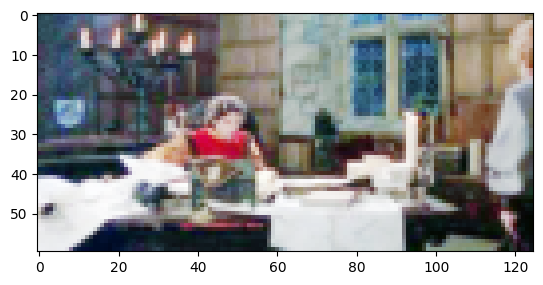

In [18]:
"""
A sanity check cell to verify the data pipeline.
It grabs a single batch from the training dataset and prints the shapes of the returned tensors (images, descriptions, etc.) to ensure everything is loaded correctly.
"""
#Modified
# Single sample check
sample = sp_train_dataset[np.random.randint(0,400)]
frames, image_target, roi1, roi2, roi_valid, roi_frame, ent_id, text_dict, obj_labels = sample


print("Description: ", image_target.shape)
figure, ax = plt.subplots(1,1)
show_image(ax, image_target)

# Do some tests on the batches (try with batch size small)
frames, descriptions, image_target, text_target, roi1, roi2, roi_valid, roi_frame, ent_id = next(iter(train_dataloader))
print(frames.shape)
print(descriptions.shape)

I will leave the test of the other datasets to you.

# **Chapter 2: Models**


---



We provide a simple text encoder based on a recurrent neural network (LSTM). Feel free to provide your own text encoder.

## 2.1 The NLP models

In [16]:
# @title The text autoencoder (Seq2Seq)
#Modified
class RobertaEncoder(nn.Module):
    def __init__(self, hidden_dim, num_layers=num_layers, dropout=dropout, unfreeze_layers=6):
        super().__init__()

        self.roberta = RobertaModel.from_pretrained("roberta-base")

        # Freeze everything
        for param in self.roberta.parameters():
            param.requires_grad = False

        # Unfreeze last N layers
        for layer in self.roberta.encoder.layer[-unfreeze_layers:]:
            for param in layer.parameters():
                param.requires_grad = True

        # =========================
        # Attention Pooling (nonlinear)
        # =========================
        self.attn_pool = nn.Sequential(
            nn.Linear(self.roberta.config.hidden_size, 128),
            nn.Tanh(),
            nn.Linear(128, 1)
        )

        # =========================
        # Projection Head (512 → 256)
        # =========================
        self.projection = nn.Sequential(
            nn.Linear(self.roberta.config.hidden_size, 512),
            nn.GELU(),
            nn.LayerNorm(512),
            nn.Dropout(dropout),

            nn.Linear(512, 256),
            nn.GELU(),
            nn.LayerNorm(256),
            nn.Dropout(dropout),

            nn.Linear(256, hidden_dim)
        )

        self.layer_norm = nn.LayerNorm(hidden_dim)
        self.dropout = nn.Dropout(dropout)

    def forward(self, input_ids, attention_mask=None):
        outputs = self.roberta(
            input_ids=input_ids,
            attention_mask=attention_mask
        )

        last_hidden = outputs.last_hidden_state  # (B, T, 768)

        # =========================
        # Attention Pooling
        # =========================
        attn_scores = self.attn_pool(last_hidden)  # (B, T, 1)

        if attention_mask is not None:
            mask = attention_mask.unsqueeze(-1)
            attn_scores = attn_scores.masked_fill(mask == 0, torch.finfo(attn_scores.dtype).min)

        attn_weights = torch.softmax(attn_scores, dim=1)
        pooled = torch.sum(attn_weights * last_hidden, dim=1)  # (B, 768)

        # =========================
        # CLS Token Fusion
        # =========================
        cls_token = last_hidden[:, 0]  # (B, 768)
        pooled = 0.7 * pooled + 0.3 * cls_token

        # =========================
        # Projection
        # =========================
        latent = self.projection(pooled)

        # Final normalization
        latent = self.layer_norm(latent)
        latent = self.dropout(latent)

        # =========================
        # LSTM-compatible output
        # =========================
        hidden = latent.unsqueeze(0).repeat(2, 1, 1) # Match 2-layer LSTM
        cell = torch.zeros_like(hidden)

        return latent, hidden, cell # returns latent as the first output

#Modified to have two layers and weight tying
class DecoderLSTM(nn.Module):
    """
      Decodes a latent space representation into a sequence of tokens.
    """
    def __init__(self, vocab_size, embedding_dim, hidden_dim, num_layers=num_layers, dropout=dropout):
        super().__init__()
        self.vocab_size = vocab_size
        self.embedding_dim = embedding_dim
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers

        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, num_layers,
                            batch_first=True, dropout=dropout if num_layers > 1 else 0)
        # Added a small MLP head for better word prediction stability
        self.head = nn.Sequential(
            nn.Linear(hidden_dim, embedding_dim),
            nn.GELU(),
            nn.LayerNorm(embedding_dim)
        )

        self.out = nn.Linear(hidden_dim, vocab_size)

        # Weight Tying: Share weights between embedding and output linear layer
        self.out.weight = self.embedding.weight

    def forward(self, input_seq, hidden, cell):
        embedded = self.embedding(input_seq)
        output, (hidden, cell) = self.lstm(embedded, (hidden, cell))
        output = self.head(output)
        prediction = self.out(output)
        return prediction, hidden, cell
#Modified
# We create the basic text autoencoder (a special case of a sequence to sequence model)
class Seq2SeqLSTM(nn.Module):
    def __init__(self, encoder, decoder):
        super().__init__()
        self.encoder = encoder
        self.decoder = decoder

    def forward(self, input_seq, target_seq, attention_mask=None):
        # Pass keyword args to RobertaEncoder
        _enc_out, hidden, cell = self.encoder(
            input_ids=input_seq,      # Keyword arg
            attention_mask=attention_mask
        )



        decoder_input = target_seq
        predictions, _hidden, _cell = self.decoder(decoder_input, hidden, cell)
        return predictions

In [17]:
# @title Utility functions for NLP tasks
"""
1. `generate`: An inference function for the text decoder.
   - It performs autoregressive generation: predicting one token at a time and feeding it back as input for the next step.
   - Uses temperature scaling for sampling diversity.
"""

def generate(model, hidden, cell, max_len, sos_token_id, eos_token_id):
      """
        This function generates a sequence of tokens using the provided decoder.
      """
      # Ensure the model is in evaluation mode
      model.eval()

      # 2. SETUP DECODER INPUT
      # Start with the SOS token, shape (1, 1)
      dec_input = torch.tensor([[sos_token_id]], dtype=torch.long, device=device)
      # hidden = torch.zeros(1, 1, hidden_dim, device=device)
      # cell = torch.zeros(1, 1, hidden_dim, device=device)

      generated_tokens = []

      # 3. AUTOREGRESSIVE LOOP
      for _ in range(max_len):
          with torch.no_grad():
              # Run the decoder one step at a time
              # dec_input is (1, 1) here—it's just the last predicted token
              prediction, hidden, cell = model(dec_input, hidden, cell)

          logits = prediction.squeeze(1) # Shape (1, vocab_size)
          temperature = 0.9 # <--- Try a value between 0.5 and 1.0

          # 1. Divide logits by temperature
          # 2. Apply softmax to get probabilities
          # 3. Use multinomial to sample one token based on the probabilities
          probabilities = torch.softmax(logits / temperature, dim=-1)
          next_token = torch.multinomial(probabilities, num_samples=1)

          token_id = next_token.squeeze().item()

          # Check for the End-of-Sequence token
          if token_id == eos_token_id:
              break

          if token_id == 0 or token_id == sos_token_id:
              continue

            # Append the predicted token
          generated_tokens.append(token_id)

          # The predicted token becomes the input for the next iteration
          dec_input = next_token

      # Return the list of generated token IDs
      return generated_tokens

In [21]:
# @title Do some tests
"""
Manually testing the text generation capabilities of the model.
"""

# desc = text_dataset[np.random.randint(0, 100)]
# print(f"Input: {desc}")
# input_ids = tokenizer(desc, return_tensors="pt",  padding=True, truncation=True).input_ids
# input_ids = input_ids.to(device)
# generated_tokens = generate(model, hidden, cell, max_len=100, sos_token_id=tokenizer.cls_token_id, eos_token_id=tokenizer.sep_token_id)
# print("Output: ", tokenizer.decode(generated_tokens))

'\nManually testing the text generation capabilities of the model.\n'

## 2.2 The Vision models

In [18]:
# @title The visual autoencoder
"""
Defines the computer vision modules:
1. `Backbone`: A CNN that processes input images into feature maps.
2. `VisualEncoder`: Uses two backbones to separate 'content' and 'context' features, projecting them to a latent space.
3. `VisualDecoder`: Reconstructs images from the latent representation using Transposed Convolutions.
4. `VisualAutoencoder`: The container class for the encoder and decoder.
"""

# =========================================================
# Residual Block
# =========================================================

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()

        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, 3, padding=1),
            nn.GroupNorm(8, channels),
            nn.GELU(),

            nn.Conv2d(channels, channels, 3, padding=1),
            nn.GroupNorm(8, channels)
        )

        self.act = nn.GELU()

    def forward(self, x):
        return self.act(x + self.block(x))


# =========================================================
# CLIP Encoder
# =========================================================

class CLIPEncoderWrapper(nn.Module):

    def __init__(self, latent_dim, unfreeze_layers=2):
        super().__init__()

        self.clip = CLIPModel.from_pretrained(
            "openai/clip-vit-base-patch16"
        )

        self.clip.vision_model.config.output_hidden_states = True
        self.clip.config.output_hidden_states = True

        # Freeze CLIP
        for p in self.clip.parameters():
            p.requires_grad = False

        # Unfreeze last layers
        if unfreeze_layers > 0:
            for layer in self.clip.vision_model.encoder.layers[-unfreeze_layers:]:
                for p in layer.parameters():
                    p.requires_grad = True

        hidden_dim = self.clip.config.vision_config.hidden_size

        self.projection = nn.Sequential(
            nn.Linear(hidden_dim, 512),
            nn.LayerNorm(512),
            nn.GELU(),
            nn.Linear(512, latent_dim)
        )

    def forward(self, x):

        # Resize to CLIP input
        x = F.interpolate(
            x,
            size=(224, 224),
            mode='bilinear',
            align_corners=False
        )

        mean = torch.tensor(
            [0.481, 0.457, 0.408],
            device=x.device
        ).view(1,3,1,1)

        std = torch.tensor(
            [0.268, 0.261, 0.275],
            device=x.device
        ).view(1,3,1,1)

        x = (x - mean) / std


        vision_outputs = self.clip.vision_model(
            pixel_values=x,
            return_dict=True
        )


        # Global latent
        z = self.projection(
            vision_outputs.pooler_output
        )

        # Spatial features
        low_feat = (
            vision_outputs.hidden_states[3][:, 1:, :]
            .transpose(1, 2)
            .reshape(-1, 768, 14, 14)
        )

        mid_feat = (
            vision_outputs.hidden_states[6][:, 1:, :]
            .transpose(1, 2)
            .reshape(-1, 768, 14, 14)
        )

        high_feat = (
            vision_outputs.hidden_states[9][:, 1:, :]
            .transpose(1, 2)
            .reshape(-1, 768, 14, 14)
        )

        return z, low_feat, mid_feat, high_feat

# =========================================================
# Decoder
# =========================================================

class VisualDecoder(nn.Module):
    def __init__(self, latent_dim):
        super().__init__()

        # =====================================================
        # Global latent projection
        # =====================================================

        self.fc = nn.Linear(latent_dim, 256 * 14 * 14)

        # =====================================================
        # Skip projections
        # =====================================================

        self.low_skip  = nn.Conv2d(768, 64, kernel_size=1)
        self.mid_skip  = nn.Conv2d(768, 64, kernel_size=1)
        self.high_skip = nn.Conv2d(768, 64, kernel_size=1)

        # =====================================================
        # Fusion layer
        # =====================================================

        self.initial_fusion = nn.Conv2d(
            256 + 64 + 64 + 64,
            256,
            kernel_size=3,
            padding=1
        )

        # =====================================================
        # Decoder blocks
        # =====================================================

        self.up1 = nn.Sequential(
            ResidualBlock(256),
            nn.ConvTranspose2d(256, 128, 4, 2, 1),
            nn.GroupNorm(8, 128),
            nn.GELU(),
            ResidualBlock(128)
        )

        self.up2 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 4, 2, 1),
            nn.GroupNorm(8, 64),
            nn.GELU(),
            ResidualBlock(64)
        )

        self.up3 = nn.Sequential(
            nn.ConvTranspose2d(64, 32, 4, 2, 1),
            nn.GroupNorm(8, 32),
            nn.GELU(),
            ResidualBlock(32)
        )

        # STAGE (112 → 224)
        self.up4 = nn.Sequential(
            nn.ConvTranspose2d(32, 16, 4, 2, 1),
            nn.GroupNorm(8, 16),
            nn.GELU(),
            ResidualBlock(16)
        )

        # Final RGB output
        self.final = nn.Sequential(
            nn.Conv2d(16, 3, 3, padding=1),
            nn.Sigmoid()
        )

    def forward(self, z, low_feat, mid_feat, high_feat):

        B = z.size(0)

        # Global latent → feature map
        x = self.fc(z).view(B, 256, 14, 14)

        # Skip features
        low  = self.low_skip(low_feat)
        mid  = self.mid_skip(mid_feat)
        high = self.high_skip(high_feat)

        # Fusion
        x = torch.cat([x, low, mid, high], dim=1)
        x = self.initial_fusion(x)

        # Progressive upsampling
        x = self.up1(x)   # 14 → 28
        x = self.up2(x)   # 28 → 56
        x = self.up3(x)   # 56 → 112
        x = self.up4(x)   # 112 → 224

        x = self.final(x)

        return x


# =========================================================
# Autoencoder
# =========================================================

class VisualAutoencoder(nn.Module):
    def __init__(self, latent_dim=128):
        super().__init__()

        self.encoder = CLIPEncoderWrapper(latent_dim)
        self.decoder = VisualDecoder(latent_dim)

    def forward(self, x):

        z, low, mid, high = self.encoder(x)

        x_hat = self.decoder(z, low, mid, high)

        return x_hat

# =========================================================
# Perceptual Loss
# =========================================================

class PerceptualLoss(nn.Module):
    def __init__(self):
        super().__init__()

        vgg = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_FEATURES)

        self.features = nn.Sequential(
            *list(vgg.features[:16])
        ).eval()

        for p in self.features.parameters():
            p.requires_grad = False

    def forward(self, pred, target):

        pred_feat = self.features(pred)
        target_feat = self.features(target)

        return F.l1_loss(pred_feat, target_feat)

# =========================================================
# Combined Reconstruction Loss
# =========================================================

class ReconstructionLoss(nn.Module):
    def __init__(
        self,
        pixel_weight=0.7,
        perceptual_weight=0.3
    ):
        super().__init__()

        self.pixel_weight = pixel_weight
        self.perceptual_weight = perceptual_weight

        self.perceptual = PerceptualLoss()

    def forward(self, pred, target):

        pixel_loss = (
            0.5 * F.mse_loss(pred, target)
            +
            0.5 * F.l1_loss(pred, target)
        )

        perceptual_loss = self.perceptual(pred, target)

        total = (
            self.pixel_weight * pixel_loss
            +
            self.perceptual_weight * perceptual_loss
        )

        return total


## 2.3 The main architecture


In [19]:
# @title A simple attention architecture
"""
Defines an `Attention` module.
It computes attention weights over a sequence of RNN outputs to create a context vector, helping the model focus on relevant parts of the input sequence.
"""

class Attention(nn.Module):
    def __init__(self, hidden_dim):
        super(Attention, self).__init__()
        # This "attention" layer learns a query vector
        self.attn = nn.Linear(hidden_dim, 1)
        self.softmax = nn.Softmax(dim=1) # Over the sequence length

    def forward(self, rnn_outputs):
        # rnn_outputs shape: [batch, seq_len, hidden_dim]

        # Pass through linear layer to get "energy" scores
        energy = self.attn(rnn_outputs).squeeze(2) # Shape: [batch, seq_len]

        # Get attention weights
        attn_weights = self.softmax(energy) # Shape: [batch, seq_len]

        # Apply weights
        # attn_weights.unsqueeze(1) -> [batch, 1, seq_len]
        # bmm with rnn_outputs -> [batch, 1, hidden_dim]
        context = torch.bmm(attn_weights.unsqueeze(1), rnn_outputs)

        # Squeeze to get final context vector
        return context.squeeze(1), attn_weights # Return both context and attention weights

In [20]:
text_encoder = RobertaEncoder(hidden_dim=latent_dim)
text_decoder = DecoderLSTM(vocab_size=tokenizer.vocab_size,
                          embedding_dim=emb_dim,
                          hidden_dim=latent_dim)

text_autoencoder = Seq2SeqLSTM(text_encoder, text_decoder)


Loading weights: 100%|██████████| 197/197 [00:00<00:00, 674.39it/s]
RobertaModel LOAD REPORT from: roberta-base
Key                             | Status     | 
--------------------------------+------------+-
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
lm_head.bias                    | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
pooler.dense.weight             | MISSING    | 
pooler.dense.bias               | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


In [21]:
# @title Variables and initial setup
"""
Global setup:
- Sets the computation device (CUDA/CPU).
- Defines hyperparameters: `N_EPOCHS`, `emb_dim`, `latent_dim`, etc.
"""

torch.cuda.empty_cache()
gc.collect()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# @title Training utility functions: To initialize and to visualize the progress
"""
1. `init_weights`: Initializes neural network weights using Kaiming Normal initialization.
2. `validation`: A visualization routine. It runs the model on a validation batch and plots:
   - The 4 input frames and their descriptions.
   - The target (Ground Truth) frame and description.
   - The model's predicted frame and generated text description.
"""

def init_weights(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='leaky_relu')
        if m.bias is not None:
            nn.init.zeros_(m.bias)
    elif isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='leaky_relu')
        nn.init.constant_(m.bias, 0)


In [22]:
visual_autoencoder = VisualAutoencoder(latent_dim=latent_dim).to(device)
visual_autoencoder.decoder.apply(init_weights)

total_params = sum(p.numel() for p in visual_autoencoder.parameters() if p.requires_grad)
print(f"Total trainable parameters in visual autoencoder: {total_params}")

Loading weights: 100%|██████████| 398/398 [00:00<00:00, 4278.22it/s]
CLIPModel LOAD REPORT from: openai/clip-vit-base-patch16
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Total trainable parameters in visual autoencoder: 24560739


In [23]:
# @title The main sequence predictor model
"""
This is the core architecture `SequencePredictor`.
1. **Encoders**: Uses the `image_encoder` and `text_encoder` to process the sequence of 4 input frames and descriptions.
2. **Temporal Fusion**: A GRU processes the sequence of fused (image+text) embeddings to capture temporal dynamics.
3. **Attention**: Applies attention over the sequence to summarize context.
4. **Decoders**: Predicts the *next* (5th) frame's image and text using `image_decoder` and `text_decoder`.
"""
#Modified
class SequencePredictor(nn.Module):
    def __init__(self, visual_autoencoder, text_autoencoder, latent_dim, gru_hidden_dim):
        super(SequencePredictor, self).__init__()

        # --- 1. Static Encoders ---
        self.image_encoder = visual_autoencoder.encoder
        self.text_encoder = text_autoencoder.encoder  # This is HuggingFace RobertaModel


        # --- 2. Temporal Encoder ---
        fusion_dim = latent_dim * 2  # z_visual + z_text
        self.temporal_rnn = nn.GRU(fusion_dim, latent_dim, batch_first=True)

        # --- 3. Attention ---
        self.attention = Attention(gru_hidden_dim)

        # --- 4. Final Projection ---
        self.projection = nn.Sequential(
            nn.Linear(gru_hidden_dim * 2, latent_dim),
            nn.ReLU()
        )

        # --- 5. Decoders ---
        self.image_decoder = visual_autoencoder.decoder
        self.text_decoder = text_autoencoder.decoder

        # For initializing decoder hidden/cell
        self.fused_to_h0 = nn.Linear(latent_dim, latent_dim)
        self.fused_to_c0 = nn.Linear(latent_dim, latent_dim)

    def forward(self, image_seq, input_ids_text_encoder, attention_mask_text_encoder, target_seq_text_decoder):
        # image_seq: [batch_size, K, C, H, W]
        batch_size, K, C, H, W = image_seq.shape
        # input_ids_text_encoder: [batch_size, K, max_len]
        # attention_mask_text_encoder: [batch_size, K, max_len]
        # target_seq_text_decoder: [batch_size, max_len - 1]
        if input_ids_text_encoder.dim() == 2:
          input_ids_text_encoder = input_ids_text_encoder.unsqueeze(1).repeat(1, K, 1)
          attention_mask_text_encoder = attention_mask_text_encoder.unsqueeze(1).repeat(1, K, 1)


        _, _, T_max = input_ids_text_encoder.shape


        # --- 1. Image Encoder ---
        img_flat = image_seq.view(batch_size * K, C, H, W)
        z_v_flat, low_feat, mid_feat, high_feat = self.image_encoder(img_flat)
        z_v_seq = z_v_flat.view(batch_size, K, -1) # [batch_size, K, latent_dim]


        # --- 2. Text Encoder ---
        # 2a. Encode text for EACH frame in the input sequence (for temporal fusion)
        input_ids_flat_for_roberta = input_ids_text_encoder.view(batch_size * K, T_max)
        attention_mask_flat_for_roberta = attention_mask_text_encoder.view(batch_size * K, T_max)

        roberta_latent_flat, _, _ = self.text_encoder(
            input_ids=input_ids_flat_for_roberta,
            attention_mask=attention_mask_flat_for_roberta
        )
        z_t_seq = roberta_latent_flat.view(batch_size, K, -1) # [batch_size, K, latent_dim]

        # 2b. Encode text for the FIRST frame for grounding losses (as per original comment's intention)
        input_ids_first_frame = input_ids_text_encoder[:, 0, :] # [batch_size, T_max]
        attention_mask_first_frame = attention_mask_text_encoder[:, 0, :] # [batch_size, T_max]

        z_t_grounding, _, _ = self.text_encoder(
            input_ids=input_ids_first_frame,
            attention_mask=attention_mask_first_frame
        ) # z_t_grounding is [batch_size, latent_dim]


        # --- 3. Fusion for temporal RNN ---
        z_fusion_seq = torch.cat((z_v_seq, z_t_seq), dim=2) # [batch_size, K, 2*latent_dim]

        zseq, h = self.temporal_rnn(z_fusion_seq) # zseq: [B, K, latent_dim], h: [1, B, latent_dim]
        h = h.squeeze(0) # h: [B, latent_dim]

        # --- 4. Attention ---
        context, attn_weights = self.attention(zseq) # context: [B, latent_dim], attn_weights: [B, K]

        # --- 5. Final latent for decoders ---
        z = self.projection(torch.cat((h, context), dim=1)) # z: [B, latent_dim]


        # --- 6. Image decoder ---
        # Reshape and aggregate low, mid, high features for the decoder
        low_feat_seq = low_feat.view(batch_size, K, 768, 14, 14)
        mid_feat_seq = mid_feat.view(batch_size, K, 768, 14, 14)
        high_feat_seq = high_feat.view(batch_size, K, 768, 14, 14)

        # Average across the sequence dimension (K) for decoder inputs
        low_feat_avg = low_feat_seq.mean(dim=1) # [B, 768, 14, 14]
        mid_feat_avg = mid_feat_seq.mean(dim=1) # [B, 768, 14, 14]
        high_feat_avg = high_feat_seq.mean(dim=1) # [B, 768, 14, 14]

        pred_image_content = self.image_decoder(z, low_feat_avg, mid_feat_avg, high_feat_avg)
        pred_image_context = pred_image_content # Assuming for simplicity or if image decoder only outputs content

        # --- 7. Text decoding (teacher forcing) ---
        h0 = self.fused_to_h0(z).unsqueeze(0).repeat(self.text_decoder.num_layers, 1, 1)
        c0 = self.fused_to_c0(z).unsqueeze(0).repeat(self.text_decoder.num_layers, 1, 1)
        predicted_text_logits_k, _hidden, _cell = self.text_decoder(target_seq_text_decoder, h0, c0)

        # Return h0, c0 for generation in validation
        # Include attn_weights in the return
        return pred_image_content, pred_image_context, predicted_text_logits_k, h0, c0, z_v_flat, z_t_grounding, attn_weights


# **Chapter 3: Training routines**


---




In [28]:
# @title Early stopping
class EarlyStopping:
    """
    Early stops the training if validation loss doesn't improve after a given patience.
    """
    def __init__(self, patience=5, min_delta=0, verbose=False):
        self.patience = patience
        self.min_delta = min_delta
        self.verbose = verbose
        self.best_loss = None
        self.num_bad_epochs = 0
        self.stop = False

    def step(self, current_loss):
        if self.best_loss is None:
            self.best_loss = current_loss
        elif current_loss < self.best_loss - self.min_delta:
            if self.verbose:
                print(f"Loss improved from {self.best_loss:.4f} to {current_loss:.4f}. Resetting patience.")
            self.best_loss = current_loss
            self.num_bad_epochs = 0
        else:
            self.num_bad_epochs += 1
            if self.verbose:
                print(f"Loss did not improve. Patience: {self.num_bad_epochs}/{self.patience}")
            if self.num_bad_epochs >= self.patience:
                self.stop = True
        return self.stop

In [29]:

# @title Example text reconstruction task
"""
EXPLANATION:
A standalone training loop for the text autoencoder.
This is used if you want to pre-train or fine-tune the text module separately before the main task.
"""
# Don't forget to unfreeze the model!
# We need to unfreeze the parameters so we can calculate gradients

# Unfreeze for pre-training
for param in text_autoencoder.parameters():
    param.requires_grad = True

# Ensure the model is on the correct device before defining optimizer if optimizer state includes device-specific tensors
text_autoencoder.to(device)

loss_fn = nn.CrossEntropyLoss(ignore_index=tokenizer.convert_tokens_to_ids(tokenizer.pad_token))
optimizer = torch.optim.Adam(text_autoencoder.parameters(), lr=0.0001)

# Initialize Early Stopping
early_stopper = EarlyStopping(patience=4, verbose=True)
N_EPOCHS = 86

# --- Checkpoint Loading Logic ---
start_epoch = 0
initial_loss = float('inf')
checkpoint_filename = "text_autoencoder.pth"

try:
    # Attempt to load the latest checkpoint
    text_autoencoder, optimizer, start_epoch, initial_loss = load_checkpoint_from_drive(
        text_autoencoder, optimizer, filename=checkpoint_filename
    )
    # Move the model to the device after loading from checkpoint
    text_autoencoder.to(device)

    print(f"Resuming training from epoch {start_epoch + 1} with initial loss {initial_loss:.4f}")
    # Update early stopper's best loss if loaded checkpoint had a better loss
    early_stopper.best_loss = initial_loss
except FileNotFoundError:
    print("No previous checkpoint found. Starting training from scratch.")
except Exception as e:
    print(f"Error loading checkpoint: {e}. Starting training from scratch.")
# --------------------------------

for epoch in range(start_epoch, N_EPOCHS):

    # Reduce LR at epoch 75
    if epoch == 75:
        for param_group in optimizer.param_groups:
            param_group['lr'] *= 0.5
        print(f"[LR UPDATE] Learning rate reduced to {optimizer.param_groups[0]['lr']} at epoch {epoch}")

    text_autoencoder.train()
    epoch_loss = 0

    for batch in text_dataloader:
        input_ids_encoder = batch["input_ids"].to(device)
        attention_mask_encoder = batch["attention_mask"].to(device)
        decoder_input_ids_lstm = batch["decoder_input_ids"].to(device)
        target_ids_lstm = batch["target_ids"].to(device)

        optimizer.zero_grad()

        predictions = text_autoencoder(
            input_seq=input_ids_encoder,
            target_seq=decoder_input_ids_lstm,
            attention_mask=attention_mask_encoder
        )

        loss = loss_fn(
            predictions.reshape(-1, tokenizer.vocab_size),
            target_ids_lstm.reshape(-1)
        )

        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    avg_loss = epoch_loss / len(text_dataloader)
    print(f"Epoch {epoch+1}/{N_EPOCHS}; Avg loss {avg_loss:.4f}")

    # Save checkpoint after each epoch
    save_checkpoint_to_drive(text_autoencoder, optimizer, epoch + 1, avg_loss, filename=checkpoint_filename)

    # Check Early Stopping
    if early_stopper.step(avg_loss):
        print("Early stopping text pre-training...Stopping training due to no improvement in loss.")
        break

Checkpoint loaded from: /content/drive/MyDrive/DL_Checkpoints/text_autoencoder.pth (epoch 86)
Resuming training from epoch 87 with initial loss 3.3830


Downloading: "https://download.pytorch.org/models/vgg16_features-amdegroot-88682ab5.pth" to /root/.cache/torch/hub/checkpoints/vgg16_features-amdegroot-88682ab5.pth


100%|██████████| 528M/528M [00:10<00:00, 52.1MB/s]


Step 0/1500 | Loss: 0.8035


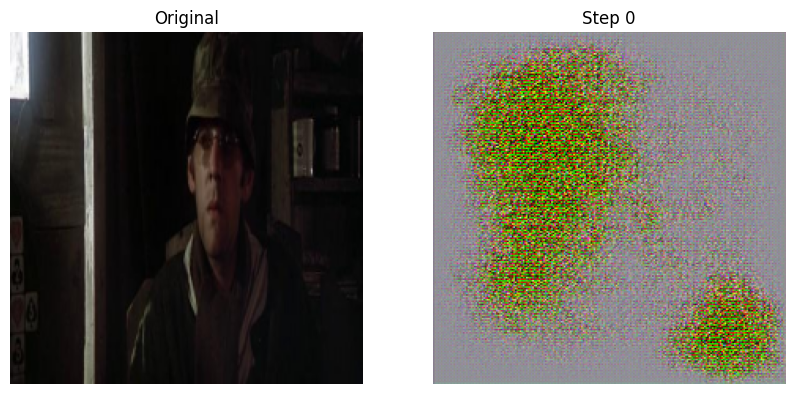

Step 50/1500 | Loss: 0.4304
Step 100/1500 | Loss: 0.2697
Step 150/1500 | Loss: 0.1508
Step 200/1500 | Loss: 0.0888


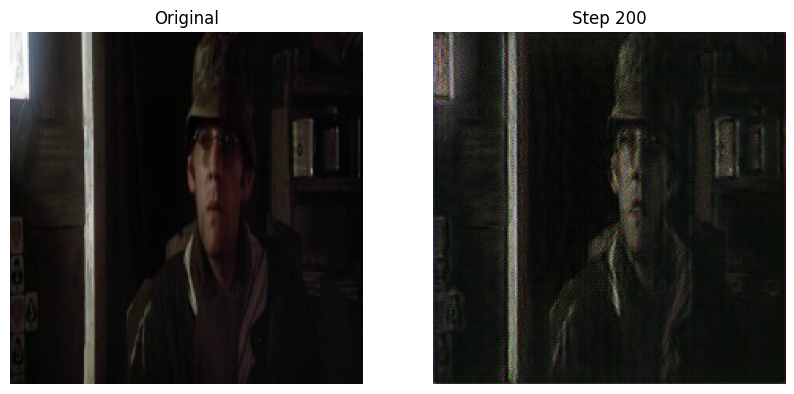

Step 250/1500 | Loss: 0.0662
Step 300/1500 | Loss: 0.0552
Step 350/1500 | Loss: 0.0484
Step 400/1500 | Loss: 0.0444


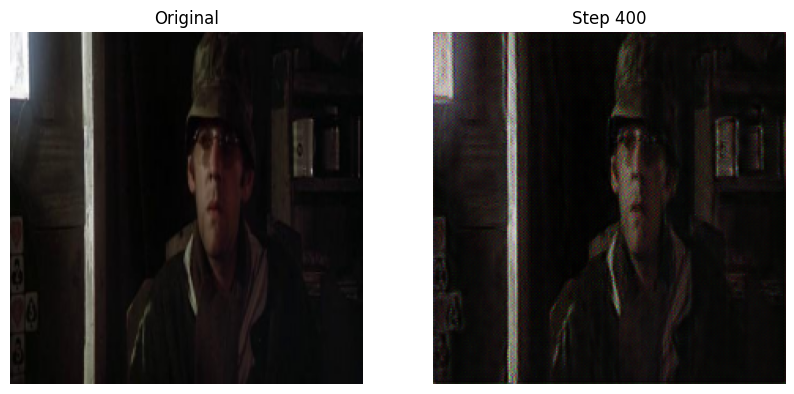

Step 450/1500 | Loss: 0.0405
Step 500/1500 | Loss: 0.0374
Step 550/1500 | Loss: 0.0342
Step 600/1500 | Loss: 0.0323


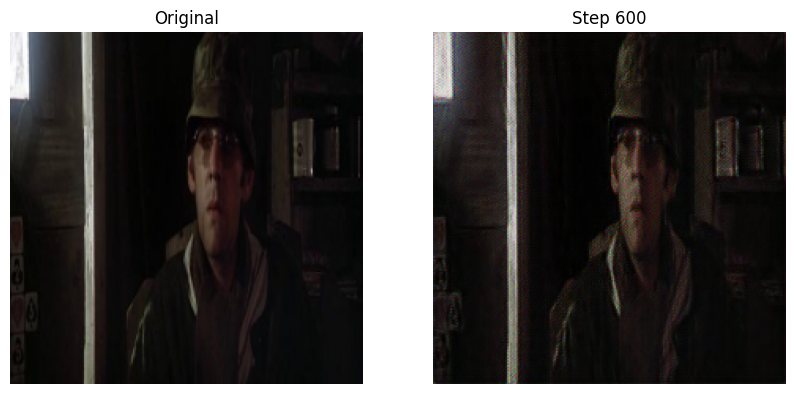

Step 650/1500 | Loss: 0.0309
Step 700/1500 | Loss: 0.0290
Step 750/1500 | Loss: 0.0280
Step 800/1500 | Loss: 0.0262


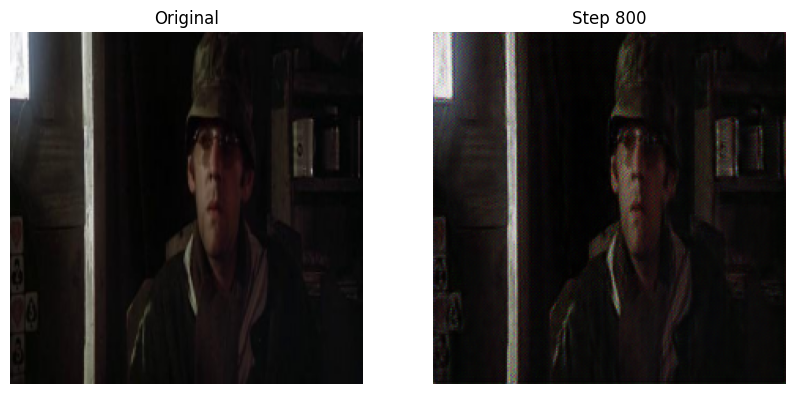

Step 850/1500 | Loss: 0.0249
Step 900/1500 | Loss: 0.0241
Step 950/1500 | Loss: 0.0231
Step 1000/1500 | Loss: 0.0223


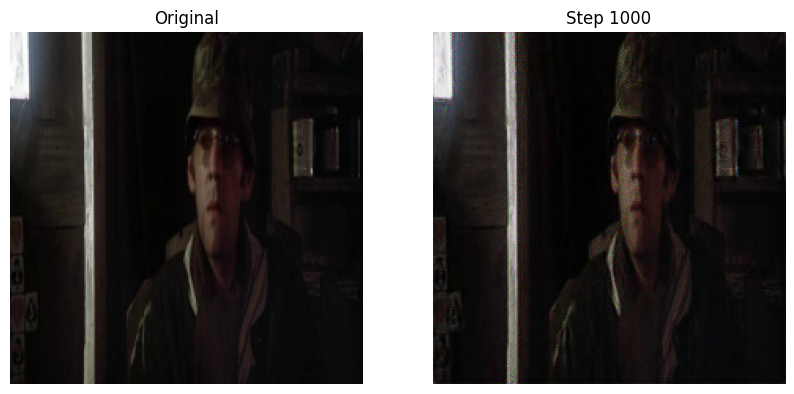

Step 1050/1500 | Loss: 0.0214
Step 1100/1500 | Loss: 0.0210
Step 1150/1500 | Loss: 0.0208
Step 1200/1500 | Loss: 0.0200


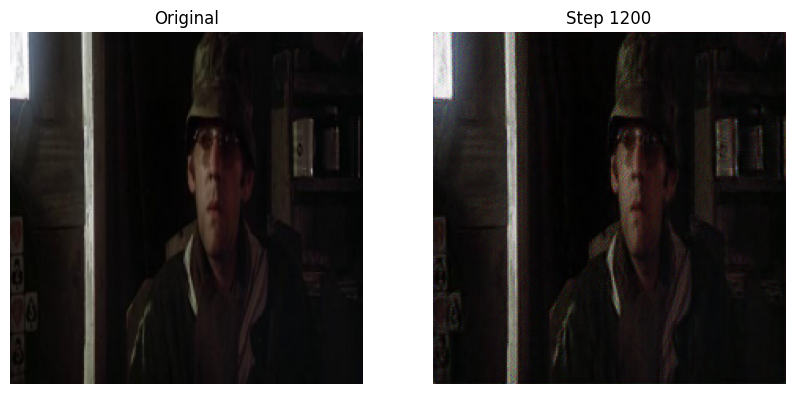

Step 1250/1500 | Loss: 0.0196
Step 1300/1500 | Loss: 0.0191
Step 1350/1500 | Loss: 0.0187
Step 1400/1500 | Loss: 0.0184


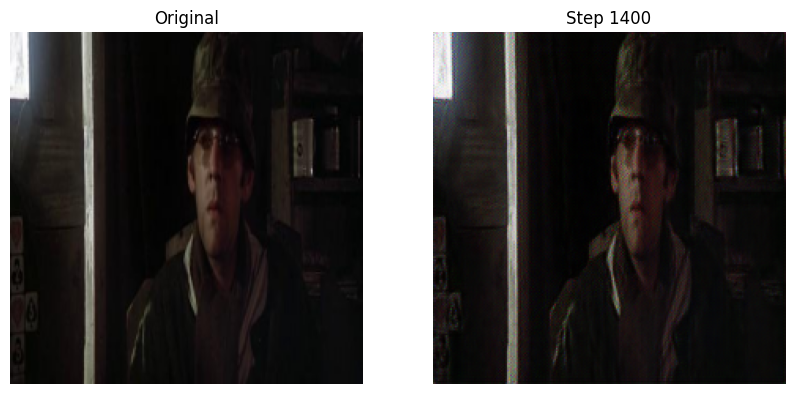

Step 1450/1500 | Loss: 0.0181


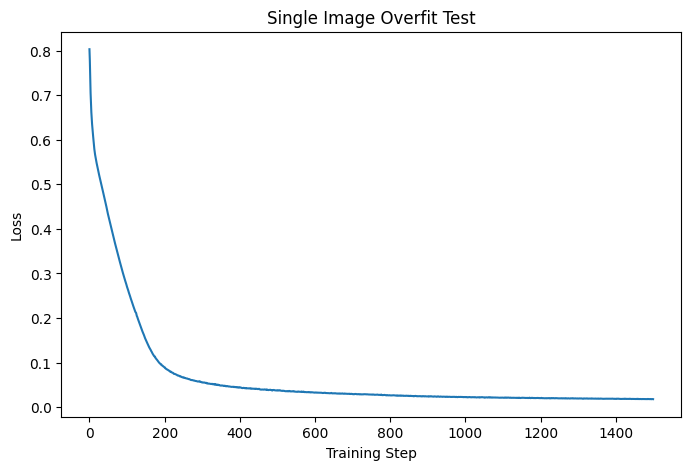

In [30]:
# @title Single Image Overfit Test
"""
This tests whether the model has enough capacity
to perfectly reconstruct one image.

If the model cannot overfit one image,
it will not reconstruct a full dataset properly.
"""

visual_autoencoder.train()

# =========================================================
# Get ONE image
# =========================================================

single_img = next(iter(autoencoder_dataloader))[0][0:1].to(device)

# Resize to CLIP resolution
single_img = F.interpolate(
    single_img,
    size=(224, 224),
    mode='bilinear',
    align_corners=False
)

# =========================================================
# Optimizer
# =========================================================

optimizer_test = torch.optim.AdamW(
    visual_autoencoder.parameters(),
    lr=1e-4
)

# =========================================================
# Loss
# =========================================================

criterion = ReconstructionLoss(
    pixel_weight=0.8,
    perceptual_weight=0.2
).to(device)

# =========================================================
# Training
# =========================================================

N_STEPS = 1500

loss_history = []

for step in range(N_STEPS):

    optimizer_test.zero_grad()

    # Forward pass
    reconstructed = visual_autoencoder(single_img)

    # Reconstruction loss
    loss = criterion(reconstructed, single_img)

    # Backward
    loss.backward()

    torch.nn.utils.clip_grad_norm_(
        visual_autoencoder.parameters(),
        1.0
    )

    optimizer_test.step()

    loss_history.append(loss.item())

    # =====================================================
    # Logging
    # =====================================================

    if step % 50 == 0:

        print(
            f"Step {step}/{N_STEPS} "
            f"| Loss: {loss.item():.4f}"
        )

    # =====================================================
    # Visualization
    # =====================================================

    if step % 200 == 0:

        visual_autoencoder.eval()

        with torch.no_grad():

            reconstructed = visual_autoencoder(single_img)

            fig, ax = plt.subplots(1, 2, figsize=(10, 5))

            # Original
            ax[0].imshow(
                single_img[0]
                .detach()
                .cpu()
                .permute(1,2,0)
                .clamp(0,1)
            )

            ax[0].set_title("Original")
            ax[0].axis("off")

            # Reconstruction
            ax[1].imshow(
                reconstructed[0]
                .detach()
                .cpu()
                .permute(1,2,0)
                .clamp(0,1)
            )

            ax[1].set_title(
                f"Step {step}"
            )

            ax[1].axis("off")

            plt.show()

        visual_autoencoder.train()

# =========================================================
# Final Loss Curve
# =========================================================

plt.figure(figsize=(8,5))
plt.plot(loss_history)
plt.xlabel("Training Step")
plt.ylabel("Loss")
plt.title("Single Image Overfit Test")
plt.show()

In [31]:
# @title Image reconstruction task
"""
A visual autoencoder pre-training loop.
This trains the visual components (CLIP Encoder + Visual Decoder)
"""


# Enable gradients
for param in visual_autoencoder.parameters():
    param.requires_grad = True

# Optimizer
optimizer_v = torch.optim.AdamW([
    {
        "params": visual_autoencoder.encoder.parameters(),
        "lr": 1e-5
    },
    {
        "params": visual_autoencoder.decoder.parameters(),
        "lr": 1e-4
    }
], weight_decay=1e-4)

# Reconstruction + perceptual loss
criterion = ReconstructionLoss(
    pixel_weight=0.8,
    perceptual_weight=0.2
).to(device)

# Early stopping
early_stopper_v = EarlyStopping(
    patience=10,
    verbose=True
)

start_epoch_v = 0
N_EPOCHS_V = 25

checkpoint_filename_v = "visual_autoencoder.pth"

# =========================================================
# Load checkpoint
# =========================================================

try:
    visual_autoencoder, optimizer_v, start_epoch_v, initial_loss_v = load_checkpoint_from_drive(
        visual_autoencoder,
        optimizer_v,
        filename=checkpoint_filename_v
    )

    print(f"Resuming from epoch {start_epoch_v + 1}")

    early_stopper_v.best_loss = initial_loss_v

except FileNotFoundError:
    print("No checkpoint found, training from scratch.")

# =========================================================
# TRAIN LOOP
# =========================================================

for epoch in range(start_epoch_v, N_EPOCHS_V):

    visual_autoencoder.train()

    epoch_loss = 0

    for batch in autoencoder_dataloader:

        images = batch[0].to(device)

        # Resize to CLIP resolution
        images = F.interpolate(
            images,
            size=(224, 224),
            mode='bilinear',
            align_corners=False
        )

        optimizer_v.zero_grad()

        # =====================================================
        # Forward pass
        # =====================================================

        reconstructed = visual_autoencoder(images)

        # =====================================================
        # Reconstruction loss
        # =====================================================

        loss = criterion(
            reconstructed,
            images
        )

        # =====================================================
        # Backpropagation
        # =====================================================

        loss.backward()

        # Gradient clipping
        torch.nn.utils.clip_grad_norm_(
            visual_autoencoder.parameters(),
            1.0
        )

        optimizer_v.step()

        epoch_loss += loss.item()

    # =========================================================
    # Epoch statistics
    # =========================================================

    avg_train = epoch_loss / len(autoencoder_dataloader)

    print(
        f"Epoch {epoch+1}/{N_EPOCHS_V}; "
        f"Avg Reconstruction Loss: {avg_train:.4f}"
    )

    # =========================================================
    # Save checkpoint
    # =========================================================

    save_checkpoint_to_drive(
        visual_autoencoder,
        optimizer_v,
        epoch + 1,
        avg_train,
        filename=checkpoint_filename_v
    )

    # =========================================================
    # Early stopping
    # =========================================================

    if early_stopper_v.step(avg_train):
        print("Early stopping triggered")
        break

    # =========================================================
    # Visualization
    # =========================================================

    if (epoch + 1) % 4 == 0:

        visual_autoencoder.eval()

        with torch.no_grad():

            sample_imgs = images[:1]

            reconstructed = visual_autoencoder(sample_imgs)

            fig, ax = plt.subplots(1, 2, figsize=(10, 5))

            # Original
            ax[0].imshow(
                sample_imgs[0]
                .detach()
                .cpu()
                .permute(1,2,0)
                .clamp(0,1)
            )

            ax[0].set_title("Original")
            ax[0].axis("off")

            # Reconstruction
            ax[1].imshow(
                reconstructed[0]
                .detach()
                .cpu()
                .permute(1,2,0)
                .clamp(0,1)
            )

            ax[1].set_title(
                f"Reconstruction Epoch {epoch+1}"
            )

            ax[1].axis("off")

            plt.show()

Checkpoint loaded from: /content/drive/MyDrive/DL_Checkpoints/visual_autoencoder.pth (epoch 25)
Resuming from epoch 26


In [32]:
# @title Training utility functions: To initialize and to visualize the progress
"""
1. `init_weights`: Initializes neural network weights using Kaiming Normal initialization.
2. `validation`: A visualization routine. It runs the model on a validation batch and plots:
   - The 4 input frames and their descriptions.
   - The target (Ground Truth) frame and description.
   - The model's predicted frame and generated text description.
"""

def init_weights(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='leaky_relu')
        if m.bias is not None:
            nn.init.zeros_(m.bias)
    elif isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='leaky_relu')
        nn.init.constant_(m.bias, 0)

#Modified
# Plots four images and their reconstructions
def validation( model, data_loader ):
  model.eval()
  with torch.no_grad():
    # Unpack 9 values from the DataLoader output
    frames, image_target_val, roi1, roi2, roi_valid, roi_frame, ent_id, text_dict_val, obj_labels = next(iter(data_loader))

    # Move tensors to device
    frames = frames.to(device)
    image_target_val = image_target_val.to(device)

    # Unpack text inputs for the model
    input_ids_roberta_val = text_dict_val["input_ids"].to(device)
    attention_mask_roberta_val = text_dict_val["attention_mask"].to(device)
    decoder_input_lstm_val = text_dict_val["decoder_input_ids"].to(device)
    target_ids_val = text_dict_val["target_ids"].to(device)

    # Call SequencePredictor with arguments
    predicted_image_content, predicted_image_context, predicted_text_logits_k, h0_dec, c0_dec, _, _, _ = model(
        frames,
        input_ids_roberta_val,
        attention_mask_roberta_val,
        decoder_input_lstm_val
    )

    figure, ax = plt.subplots(2, 6, figsize=(20, 5), gridspec_kw={'height_ratios': [2, 1.5]})


    # Display description and image for the input frames, as text_dict_val contains only its text

    for i in range(4):
          caption = tokenizer.decode(
              text_dict_val['input_ids'][0, i],
              skip_special_tokens = True
          )
          im = frames[0, i, :, :, :].cpu()
          show_image(ax[0,i], im )
          ax[0,i].set_aspect('auto')
          ax[0,i].axis('off')
          wrapped_text = textwrap.fill(caption, width=40)
          ax[1,i].text(
                0.5, 0.99,
                wrapped_text,
                ha='center',
                va='top',
                fontsize=10,
                wrap=True
            )
          ax[1,i].axis('off') # Hide axes for the text subplot

    # Display target image
    show_image(ax[0,4], image_target_val[0].cpu())
    ax[0,4].set_title('Target')
    ax[0,4].set_aspect('auto')
    ax[0,4].axis('off')

    # Display target text
    wrapped_text = textwrap.fill(tokenizer.decode(target_ids_val[0], skip_special_tokens=True), width=40)
    ax[1,4].text(
            0.5, 0.99,
            wrapped_text,
            ha='center',
            va='top',
            fontsize=10,
            wrap=False)
    ax[1,4].axis('off')

    # Display predicted image
    output = predicted_image_context[0, :, :, :].cpu()
    show_image(ax[0,5], output)
    ax[0,5].set_title('Predicted')
    ax[0,5].set_aspect('auto')
    ax[0,5].axis('off')

    # Generate and display predicted text (using h0_dec and c0_dec from model output)
    generated_tokens = generate(model.text_decoder,
                                h0_dec[:,0, :].contiguous().unsqueeze(1),
                                c0_dec[:, 0, :].contiguous().unsqueeze(1),
                                max_len=150,
                                sos_token_id=tokenizer.cls_token_id,
                                eos_token_id=tokenizer.sep_token_id)

    wrapped_text = textwrap.fill(tokenizer.decode(generated_tokens), width=40)

    ax[1,5].text(
            0.5, 0.99,
            wrapped_text,
            ha='center',
            va='top',
            fontsize=10,
            wrap=False )
    ax[1,5].axis('off')
    plt.tight_layout()
    plt.show()

## 3.1 Initialization and setup

In [33]:
# @title Variables and initial setup
"""
Global setup:
- Sets the computation device (CUDA/CPU).
- Defines hyperparameters: `N_EPOCHS`, `emb_dim`, `latent_dim`, etc.
"""

torch.cuda.empty_cache()
gc.collect()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

from src.final_training import (N_EPOCHS, emb_dim, latent_dim, num_layers, lr, max_seq_len, batch_size, dropout)
N_EPOCHS = N_EPOCHS
emb_dim = emb_dim
latent_dim = latent_dim
num_layers = num_layers
lr = lr
max_seq_len = max_seq_len
batch_size = batch_size
dropout = dropout

In [28]:

import os
import torch

def save_checkpoint(model, optimizer, epoch, loss, filename="model_checkpoint.pth"):
    """
    Saves checkpoint locally inside ./checkpoints folder.
    """

    checkpoint_dir = "./checkpoints"
    os.makedirs(checkpoint_dir, exist_ok=True)

    full_path = os.path.join(checkpoint_dir, filename)

    checkpoint = {
        "epoch": epoch,
        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict(),
        "loss": loss,
    }

    torch.save(checkpoint, full_path)
    print(f"Checkpoint saved locally: {full_path} at epoch {epoch}")


def load_checkpoint(model, optimizer=None, filename="model_checkpoint.pth", device="cpu"):
    """
    Loads checkpoint from local ./checkpoints folder.
    """

    checkpoint_dir = "./checkpoints"
    full_path = os.path.join(checkpoint_dir, filename)

    if not os.path.exists(full_path):
        raise FileNotFoundError(f"Checkpoint file not found: {full_path}")

    checkpoint = torch.load(full_path, map_location=device)

    model.load_state_dict(checkpoint["model_state_dict"])

    if optimizer is not None:
        optimizer.load_state_dict(checkpoint["optimizer_state_dict"])

    epoch = checkpoint.get("epoch", 0)
    loss = checkpoint.get("loss", None)

    print(f"Checkpoint loaded from: {full_path} (epoch {epoch})")

    return model, optimizer, epoch, loss

In [29]:
# @title Initializing the NLP models
"""
1. Instantiates the `RobertaEncoder`, `DecoderLSTM`, and `Seq2SeqLSTM`.
2. Loads pre-trained weights from Google Drive (`text_autoencoder.pth`).
3. Freezes the text autoencoder parameters to keep them fixed during the main training phase.
"""

encoder = RobertaEncoder(hidden_dim=latent_dim).to(device)
decoder = DecoderLSTM(tokenizer.vocab_size, emb_dim, latent_dim, num_layers, dropout).to(device)
text_autoencoder = Seq2SeqLSTM(encoder, decoder).to(device)
text_autoencoder, _, _, _ = load_checkpoint_from_drive(text_autoencoder, None, filename='text_autoencoder.pth')


# Deactivating training from this model for efficiency (although not ideal)
#for param in text_autoencoder.parameters():
        #param.requires_grad = True

trainable_params = sum(p.numel() for p in text_autoencoder.parameters() if p.requires_grad)
total_params = sum(p.numel() for p in text_autoencoder.parameters())

print(f"Trainable params: {trainable_params}")
print(f"Total params: {total_params}")

Loading weights: 100%|██████████| 197/197 [00:00<00:00, 224.61it/s]
RobertaModel LOAD REPORT from: roberta-base
Key                             | Status     | 
--------------------------------+------------+-
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
lm_head.bias                    | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
pooler.dense.weight             | MISSING    | 
pooler.dense.bias               | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Checkpoint loaded from: ./checkpoints\text_autoencoder.pth (epoch 86)
Trainable params: 49950682
Total params: 132069082


In [30]:
# @title Initializing visual models
"""
1. Instantiates the `VisualAutoencoder`.
2. Applies the custom weight initialization.
"""

visual_autoencoder = VisualAutoencoder(latent_dim=latent_dim)
visual_autoencoder.decoder.apply(init_weights)
visual_autoencoder, _, _, _ = load_checkpoint_from_drive(visual_autoencoder, None, filename='visual_autoencoder.pth')
total_params = sum(p.numel() for p in visual_autoencoder.parameters() if p.requires_grad)
print(f"Total trainable parameters in visual autoencoder: {total_params}")

Loading weights: 100%|██████████| 398/398 [00:00<00:00, 1497.69it/s]
CLIPModel LOAD REPORT from: openai/clip-vit-base-patch16
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Checkpoint loaded from: ./checkpoints\visual_autoencoder.pth (epoch 25)
Total trainable parameters in visual autoencoder: 24560739


In [31]:
# @title Initialize the main architecture
"""
Instantiates the full `SequencePredictor` model, wiring together the visual encoder, text encoder, and the sequence modeling components.
Prints the total number of parameters.
"""

# We put all the sizes the same, not ideal as well
sequence_predictor = SequencePredictor(visual_autoencoder, text_autoencoder, latent_dim, latent_dim)
sequence_predictor.to(device)
sequence_predictor.text_decoder = text_autoencoder.decoder # Fix for text_decoder
# # Print number of trainable parameters
sequence_predictor, _, _, _ = load_checkpoint(sequence_predictor, None, filename='roberta_clip_checkpoint.pth')
total_params = sum(p.numel() for p in sequence_predictor.parameters() if p.requires_grad)
print(f"Total trainable parameters in the whole model: {total_params}")

# Print model size
total_params = sum(p.numel() for p in sequence_predictor.parameters())
print(f"Total parameters: {total_params}")

Checkpoint loaded from: ./checkpoints\roberta_clip_checkpoint.pth (epoch 1)
Total trainable parameters in the whole model: 74725694
Total parameters: 292289087


In [37]:
dummy_input = torch.randint(0, tokenizer.vocab_size, (batch_size, max_seq_len)).to(device)
dummy_mask = torch.ones((batch_size, max_seq_len)).to(device)  # all tokens "valid"

print("===== Roberta Text Autoencoder Summary =====")

summary(
    text_autoencoder,
    input_data=(dummy_input, dummy_input, dummy_mask),  #
    col_names=["input_size", "output_size", "num_params", "trainable"],
    depth=3
)

===== Roberta Text Autoencoder Summary =====


Layer (type:depth-idx)                                            Input Shape               Output Shape              Param #                   Trainable
Seq2SeqLSTM                                                       [16, 120]                 [16, 120, 50265]          --                        Partial
├─RobertaEncoder: 1-1                                             --                        [16, 128]                 --                        Partial
│    └─RobertaModel: 2-1                                          --                        [16, 768]                 --                        Partial
│    │    └─RobertaEmbeddings: 3-1                                --                        [16, 120, 768]            (39,000,576)              False
│    │    └─RobertaEncoder: 3-2                                   [16, 120, 768]            [16, 120, 768]            85,054,464                Partial
│    │    └─RobertaPooler: 3-3                                    [16, 120, 768]        

In [38]:
# 3-channel RGB image, 64x64 resolution
dmy_image = torch.randn(batch_size, 3, 64, 64).to(device)

print("===== CLIP Visual Autoencoder Summary =====")
summary(
    visual_autoencoder,
    input_data=dmy_image,
    col_names=["input_size", "output_size", "num_params", "trainable"],
    depth=3
)

===== CLIP Visual Autoencoder Summary =====


Layer (type:depth-idx)                                                 Input Shape               Output Shape              Param #                   Trainable
VisualAutoencoder                                                      [16, 3, 64, 64]           [16, 3, 224, 224]         --                        Partial
├─CLIPEncoderWrapper: 1-1                                              [16, 3, 64, 64]           [16, 128]                 --                        Partial
│    └─CLIPModel: 2-1                                                  --                        --                        63,821,313                Partial
│    │    └─CLIPVisionTransformer: 3-1                                 --                        [16, 197, 768]            85,799,424                Partial
│    └─Sequential: 2-2                                                 [16, 768]                 [16, 128]                 --                        True
│    │    └─Linear: 3-2                                    

## 3.2 Training loops

In [39]:
# @title Training tools
"""
Sets up the optimization process:
1. `criterion_images`: L1 Loss for image reconstruction.
2. `criterion_ctx`: MSE Loss for context guidance (mean color).
3. `criterion_text`: CrossEntropy Loss for text generation.
4. `optimizer`: Adam optimizer for updating model weights.
"""

criterion_images = ReconstructionLoss(
    pixel_weight=0.8,
    perceptual_weight=0.2
).to(device)
criterion_ctx = nn.MSELoss()
criterion_text = nn.CrossEntropyLoss(ignore_index=tokenizer.convert_tokens_to_ids(tokenizer.pad_token))
optimizer = torch.optim.Adam([
    # adapt CLIP
    {"params": sequence_predictor.image_encoder.projection.parameters(), "lr": lr},
    {"params": sequence_predictor.temporal_rnn.parameters(), "lr": lr},
    {"params": sequence_predictor.attention.parameters(), "lr": lr},

    # Text side
    {"params": sequence_predictor.text_encoder.parameters(), "lr": lr},
    {"params": sequence_predictor.text_decoder.parameters(), "lr": lr},

    # Slow learner
    {"params": sequence_predictor.image_decoder.parameters(), "lr": lr * 0.85},
])

In [40]:
# Project Evaluation
# Initialize metrics from HuggingFace evaluate
rouge_metric = evaluate.load('rouge')
meteor_metric = evaluate.load('meteor')

def evaluate_model(model, dataloader):
    model.eval()
    total_text_loss = 0
    total_image_loss = 0

    all_preds_text = []
    all_gts_text = []
    bleu_scores = []
    ssim_scores = []
    psnr_scores = []
    mse_scores = []

    with torch.no_grad():
        for batch in dataloader:
            frames, image_target, roi1, roi2, roi_valid, roi_frame, ent_id, text_dict, obj_labels = batch

            descriptions = text_dict["input_ids"].to(device)
            text_target = text_dict["target_ids"].to(device)
            frames = frames.to(device)
            image_target = image_target.to(device)

            # Forward pass
            pred_image, _, predicted_text_logits_k, _, _, _, _, attn_weights = model(
                frames,
                descriptions,
                text_dict["attention_mask"].to(device),
                text_dict["decoder_input_ids"].to(device)
            )

            # FIX: Resize target to match model output resolution (224x224)
            image_target_resized = F.interpolate(
                image_target,
                size=(224, 224),
                mode='bilinear',
                align_corners=False
            )

            # Image Metrics
            img_loss = F.mse_loss(pred_image, image_target_resized)
            total_image_loss += img_loss.item()

            for i in range(image_target_resized.size(0)):
                gt_np = image_target_resized[i].cpu().permute(1, 2, 0).numpy()
                pred_np = pred_image[i].cpu().permute(1, 2, 0).numpy()

                # SSIM
                s = ssim(gt_np, pred_np, data_range=1.0, channel_axis=2)
                ssim_scores.append(s)

                # MSE
                m = np.mean((gt_np - pred_np) ** 2)
                mse_scores.append(m)

                # PSNR
                p = psnr(gt_np, pred_np, data_range=1.0)
                psnr_scores.append(p)

            # Text Metrics
            prediction_flat = predicted_text_logits_k.reshape(-1, tokenizer.vocab_size)
            target_flat = text_target.reshape(-1)
            loss_text = criterion_text(prediction_flat, target_flat)
            total_text_loss += loss_text.item()

            preds = torch.argmax(predicted_text_logits_k, dim=-1)
            for pred, tgt in zip(preds, text_target):
                pred_text = tokenizer.decode(pred, skip_special_tokens=True)
                tgt_text = tokenizer.decode(tgt, skip_special_tokens=True)

                all_preds_text.append(pred_text)
                all_gts_text.append(tgt_text)

                bleu = sentence_bleu([tgt_text.split()], pred_text.split())
                bleu_scores.append(bleu)

    rouge_results = rouge_metric.compute(predictions=all_preds_text, references=all_gts_text)
    meteor_results = meteor_metric.compute(predictions=all_preds_text, references=all_gts_text)

    return {
        "text_loss": total_text_loss / len(dataloader),
        "image_reconstruction_loss": total_image_loss / len(dataloader),
        "bleu": sum(bleu_scores) / len(bleu_scores),
        "rougeL": rouge_results['rougeL'],
        "meteor": meteor_results['meteor'],
        "ssim": sum(ssim_scores) / len(ssim_scores),
        "mse": sum(mse_scores) / len(mse_scores),
        "psnr": sum(psnr_scores) / len(psnr_scores)
    }

def plot_attention_heatmaps(model, dataloader, device, n_samples=3):
    model.eval()
    all_attn_maps = []
    sample_idx = 0

    with torch.no_grad():
        for batch in dataloader:
            if sample_idx >= n_samples: break
            frames, image_target, roi1, roi2, roi_valid, roi_frame, ent_id, text_dict, obj_labels = batch

            # Capturing attention weights (8th return value)
            _, _, _, _, _, _, _, attn_weights = model(
                frames.to(device),
                text_dict["input_ids"].to(device),
                text_dict["attention_mask"].to(device),
                text_dict["decoder_input_ids"].to(device)
            )

            for b in range(attn_weights.size(0)):
                if sample_idx >= n_samples: break
                # Reshape for the 4 input frames visualization
                attn_map = attn_weights[b].detach().cpu().numpy().reshape(1, -1)
                plt.figure(figsize=(6, 2))
                img = plt.imshow(attn_map, cmap='viridis', aspect='auto')
                plt.title(f"Attention Map Sample {sample_idx+1}\n(Importance over 4 input frames)")
                plt.xlabel("Input Frame Index (0-3)")
                plt.ylabel("Attention Value")
                cbar = plt.colorbar(img)
                cbar.set_label('Attention Weight')
                plt.show()
                all_attn_maps.append(attn_weights[b])
                sample_idx += 1

    if all_attn_maps:
        avg_attn = torch.stack(all_attn_maps).mean(dim=0).cpu().numpy().reshape(1, -1)
        plt.figure(figsize=(6, 2))
        img = plt.imshow(avg_attn, cmap='viridis', aspect='auto')
        plt.title(f"Average Attention Map ({n_samples} samples)\n(Mean importance over 4 input frames)")
        plt.xlabel("Input Frame Index (0-3)")
        plt.ylabel("Attention Value")
        cbar = plt.colorbar(img)
        cbar.set_label('Attention Weight')
        plt.show()

def get_prediction_examples(model, dataloader, n=5):
    model.eval()
    examples = []
    with torch.no_grad():
        for batch in dataloader:
            if len(examples) >= n: break
            frames, image_target, roi1, roi2, roi_valid, roi_frame, ent_id, text_dict, obj_labels = batch

            pred_img, _, pred_logits, *_ = model(
                frames.to(device),
                text_dict["input_ids"].to(device),
                text_dict["attention_mask"].to(device),
                text_dict["decoder_input_ids"].to(device)
            )

            for i in range(frames.size(0)):
                if len(examples) >= n: break
                examples.append({
                    "input_frames": frames[i].cpu().tolist(),
                    "ground_truth_image": image_target[i].cpu().tolist(),
                    "predicted_image": pred_img[i].cpu().tolist(),
                    "ground_truth_text": tokenizer.decode(text_dict["target_ids"][i], skip_special_tokens=True),
                    "predicted_text": tokenizer.decode(pred_logits[i].argmax(dim=-1), skip_special_tokens=True)
                })
    return examples



[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [45]:
def plot_reconstruction_error_maps(model, dataloader, device, n_samples=3):
    model.eval()
    shown = 0
    with torch.no_grad():
        for batch in dataloader:
            frames, image_target, roi1, roi2, roi_valid, roi_frame, ent_id, text_dict, obj_labels = batch
            frames = frames.to(device)
            image_target = image_target.to(device)

            pred_image, *_ = model(
                frames,
                text_dict["input_ids"].to(device),
                text_dict["attention_mask"].to(device),
                text_dict["decoder_input_ids"].to(device)
            )

            # Resize target to match model output resolution (224x224)
            image_target_resized = F.interpolate(
                image_target,
                size=(224, 224),
                mode='bilinear',
                align_corners=False
            )

            for i in range(frames.size(0)):
                if shown >= n_samples: return
                gt = image_target_resized[i].detach().cpu().permute(1,2,0).numpy()
                pred = pred_image[i].detach().cpu().permute(1,2,0).numpy()
                error_map = np.abs(gt - pred)

                fig, ax = plt.subplots(1, 3, figsize=(12,4))
                ax[0].imshow(gt); ax[0].set_title("Ground Truth"); ax[0].axis("off")
                ax[1].imshow(pred); ax[1].set_title("Prediction"); ax[1].axis("off")
                im = ax[2].imshow(error_map.mean(axis=2), cmap="hot")
                ax[2].set_title("Reconstruction Error Map"); ax[2].axis("off")
                plt.colorbar(im, ax=ax[2])
                plt.tight_layout(); plt.show()
                shown += 1

feature_maps = {}
def save_feature_maps(name):
    def hook(module, input, output):
        feature_maps[name] = output.detach().cpu()
    return hook



def plot_cross_modal_alignment(model, dataloader, device):
    model.eval()
    with torch.no_grad():
        batch = next(iter(dataloader))
        frames, _, _, _, _, _, _, text_dict, _ = batch
        pred_img, _, _, _, _, z_v_seq, z_t_seq, _ = model(
            frames.to(device),
            text_dict["input_ids"].to(device),
            text_dict["attention_mask"].to(device),
            text_dict["decoder_input_ids"].to(device)
        )
        z_img = F.normalize(z_v_seq.view(z_v_seq.size(0), -1), dim=-1)
        z_txt = F.normalize(z_t_seq, dim=-1)
        sim_matrix = torch.matmul(z_img, z_txt.T).cpu().numpy()
        plt.figure(figsize=(8,6))
        sns.heatmap(sim_matrix, annot=False, cmap="coolwarm")
        plt.title("Cross-Modal Alignment (Batch Image -- Text Similarity)")
        plt.xlabel("Text Embeddings Index"); plt.ylabel("Image Sequence Embeddings Index")
        plt.show()

In [50]:
def plot_feature_maps(
    model,
    dataloader,
    device,
    layer_id=11,
    head=None,
    alpha=0.6
):
    model.eval()

    # =====================================================
    # Get one batch
    # =====================================================
    batch = next(iter(dataloader))
    frames, *_ = batch

    # First image from first sequence
    image = frames[0, 0].to(device)  # [3, H, W]

    # Save original for visualization
    original_image = image.permute(1, 2, 0).cpu().numpy()

    # =====================================================
    # Resize to CLIP resolution
    # =====================================================
    image_resized = F.interpolate(
        image.unsqueeze(0),
        size=(224, 224),
        mode="bilinear",
        align_corners=False
    )

    # =====================================================
    # CLIP normalization
    # =====================================================
    mean = torch.tensor(
        [0.48145466, 0.4578275, 0.40821073],
        device=device
    ).view(1, 3, 1, 1)

    std = torch.tensor(
        [0.26862954, 0.26130258, 0.27577711],
        device=device
    ).view(1, 3, 1, 1)

    image_input = (image_resized - mean) / std

    # =====================================================
    # Forward through CLIP Vision Encoder
    # =====================================================
    with torch.no_grad():

        vision_outputs = model.image_encoder.clip.vision_model(
            pixel_values=image_input,
            output_attentions=True,
            return_dict=True
        )

    # =====================================================
    # Get attentions
    # =====================================================
    attentions = vision_outputs.attentions[layer_id]

    # Shape:
    # [B, Heads, Tokens, Tokens]

    # Remove batch
    attentions = attentions[0]

    # =====================================================
    # Select head or average heads
    # =====================================================
    if head is None:
        attn_map = attentions.mean(dim=0)
        title_head = "Average Heads"
    else:
        attn_map = attentions[head]
        title_head = f"Head {head}"

    # =====================================================
    # CLS token attention to patches
    # =====================================================
    cls_attention = attn_map[0, 1:]

    # ViT-B patches
    num_patches = int(np.sqrt(cls_attention.shape[0]))

    heatmap = cls_attention.reshape(num_patches, num_patches)

    # =====================================================
    # Upsample heatmap
    # =====================================================
    heatmap = F.interpolate(
        heatmap.unsqueeze(0).unsqueeze(0),
        size=(224, 224),
        mode="bilinear",
        align_corners=False
    )[0, 0]

    heatmap = heatmap.cpu().numpy()

    # Normalize
    heatmap = (heatmap - heatmap.min()) / (
        heatmap.max() - heatmap.min() + 1e-8
    )

    # =====================================================
    # Resize original image for overlay
    # =====================================================
    original_tensor = image.unsqueeze(0)

    original_resized = F.interpolate(
        original_tensor,
        size=(224, 224),
        mode="bilinear",
        align_corners=False
    )[0]

    original_resized = original_resized.permute(
        1, 2, 0
    ).cpu().numpy()

    original_resized = np.clip(original_resized, 0, 1)

    # =====================================================
    # Plot
    # =====================================================
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Original
    axes[0].imshow(original_resized)
    axes[0].set_title("Input Image")
    axes[0].axis("off")

    # Heatmap
    axes[1].imshow(heatmap, cmap="jet")
    axes[1].set_title(
        f"CLIP Attention Heatmap\nLayer {layer_id} | {title_head}"
    )
    axes[1].axis("off")

    # Overlay
    axes[2].imshow(original_resized)
    axes[2].imshow(
        heatmap,
        cmap="jet",
        alpha=alpha
    )

    axes[2].set_title("Attention Overlay")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

In [48]:
def plot_attention_heatmap_text(model, dataloader, device, max_batches=10):
    model.eval()

    all_attn = []
    table_data = []

    sample_idx = 0

    with torch.no_grad():
        for batch in dataloader:
            if sample_idx >= max_batches:
                break

            frames, image_target, roi1, roi2, roi_valid, roi_frame, ent_id, text_dict, obj_labels = batch

            _, _, _, _, _, _, _, attn_weights = model(
                frames.to(device),
                text_dict["input_ids"].to(device),
                text_dict["attention_mask"].to(device),
                text_dict["decoder_input_ids"].to(device)
            )

            for b in range(attn_weights.size(0)):
                if sample_idx >= max_batches:
                    break

                # -------------------------------------------------
                # Flatten attention over 4 inputs
                # -------------------------------------------------
                attn_vec = attn_weights[b].detach().cpu().numpy().flatten()

                if attn_vec.shape[0] != 4:
                    raise ValueError(f"Expected 4 inputs, got {attn_vec.shape[0]}")

                # store for table
                table_data.append(attn_vec)

                # store for global averaging
                all_attn.append(attn_vec)

                sample_idx += 1

    # =====================================================
    # 1. TABLE VIEW
    # =====================================================
    df = pd.DataFrame(
        table_data,
        columns=[f"Input_{i}" for i in range(4)]
    )

    print("\n📊 Attention Table (10 samples × 4 inputs)")
    display(df)

    # =====================================================
    # 2. HEATMAP VIEW same matrix
    # =====================================================
    plt.figure(figsize=(8, 5))
    plt.imshow(df.values, cmap="viridis", aspect="auto")

    plt.title("Attention Heatmap (Samples × Input Frames)")
    plt.xlabel("Input Frame Index (0–3)")
    plt.ylabel("Sample Index")

    cbar = plt.colorbar()
    cbar.set_label("Attention Weight")

    # annotate values inside cells
    for i in range(df.shape[0]):
        for j in range(df.shape[1]):
            plt.text(
                j, i,
                f"{df.iloc[i, j]:.3f}",
                ha="center",
                va="center",
                color="white",
                fontsize=8
            )

    plt.show()

    # =====================================================
    # 3. GLOBAL AVERAGE ATTENTION
    # =====================================================
    if len(all_attn) > 0:
        avg_attn = np.mean(all_attn, axis=0)

        plt.figure(figsize=(6, 2))
        plt.bar(range(4), avg_attn)

        plt.title("Average Attention Across Dataloader")
        plt.xlabel("Input Frame Index (0–3)")
        plt.ylabel("Mean Attention Weight")
        plt.xticks(range(4), [f"Input_{i}" for i in range(4)])

        for i, v in enumerate(avg_attn):
            plt.text(i, v, f"{v:.3f}", ha="center", va="bottom")

        plt.show()

In [43]:
# Grab one batch from the DataLoader
batch = next(iter(train_dataloader))

# Check the type of the batch
print(type(batch))

# If it's a tuple or list, check its length
if isinstance(batch, (tuple, list)):
    print("Batch length:", len(batch))
    for i, b in enumerate(batch):
        print(f"Item {i} type:", type(b))
        # If it's a tensor, print its shape
        if isinstance(b, torch.Tensor):
            print(f"  Shape: {b.shape}")
        # If it's a dict, print the keys and shapes
        elif isinstance(b, dict):
            print("  Keys:", b.keys())
            for k, v in b.items():
                print(f"    {k}: {v.shape}")
else:
    # If batch is a single tensor/dict
    print("Single item batch type:", type(batch))
    if isinstance(batch, dict):
        print("Keys:", batch.keys())
        for k, v in batch.items():
            print(f"  {k}: {v.shape}")

<class 'list'>
Batch length: 9
Item 0 type: <class 'torch.Tensor'>
  Shape: torch.Size([16, 4, 3, 60, 125])
Item 1 type: <class 'torch.Tensor'>
  Shape: torch.Size([16, 3, 60, 125])
Item 2 type: <class 'torch.Tensor'>
  Shape: torch.Size([16, 3, 60, 125])
Item 3 type: <class 'torch.Tensor'>
  Shape: torch.Size([16, 3, 60, 125])
Item 4 type: <class 'torch.Tensor'>
  Shape: torch.Size([16])
Item 5 type: <class 'torch.Tensor'>
  Shape: torch.Size([16])
Item 6 type: <class 'torch.Tensor'>
  Shape: torch.Size([16, 1])
Item 7 type: <class 'dict'>
  Keys: dict_keys(['input_ids', 'attention_mask', 'decoder_input_ids', 'target_ids'])
    input_ids: torch.Size([16, 4, 120])
    attention_mask: torch.Size([16, 4, 120])
    decoder_input_ids: torch.Size([16, 119])
    target_ids: torch.Size([16, 119])
Item 8 type: <class 'list'>


In [44]:
x = text_dataset[0]
print(type(x))
print(x.keys() if isinstance(x, dict) else len(x))

<class 'dict'>
dict_keys(['input_ids', 'attention_mask', 'decoder_input_ids', 'target_ids'])


/tmp/ipykernel_495/3504204442.py:41: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


Loading checkpoint from /content/drive/MyDrive/DL_Checkpoints/roberta_clip_checkpoint.pth
Checkpoint loaded from: /content/drive/MyDrive/DL_Checkpoints/roberta_clip_checkpoint.pth (epoch 11)
Resuming training from epoch 12


/tmp/ipykernel_495/3504204442.py:88: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch [1/5] Loss: 4.9268 (im=0.637, ctx=0.007, txt=2.944, reid=0.001, g_mse=0.394, nce=0.694, entpool=0.000)


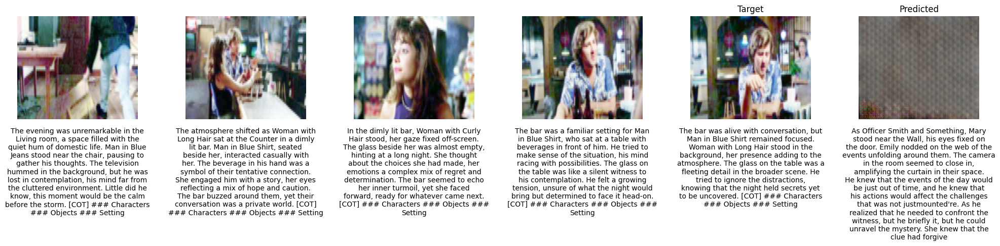

Checkpoint saved to Google Drive: /content/drive/MyDrive/DL_Checkpoints/roberta_clip_checkpoint.pth at epoch 0
Epoch [2/5] Loss: 4.9303 (im=0.683, ctx=0.010, txt=2.953, reid=0.001, g_mse=0.353, nce=1.110, entpool=0.000)


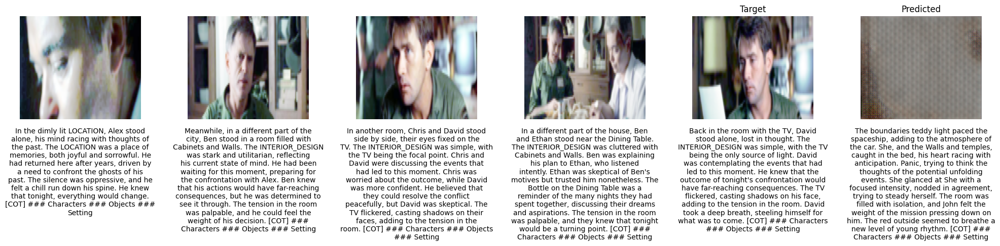

Checkpoint saved to Google Drive: /content/drive/MyDrive/DL_Checkpoints/roberta_clip_checkpoint.pth at epoch 1
Epoch [3/5] Loss: 4.9278 (im=0.655, ctx=0.011, txt=3.448, reid=0.000, g_mse=0.352, nce=0.000, entpool=0.000)


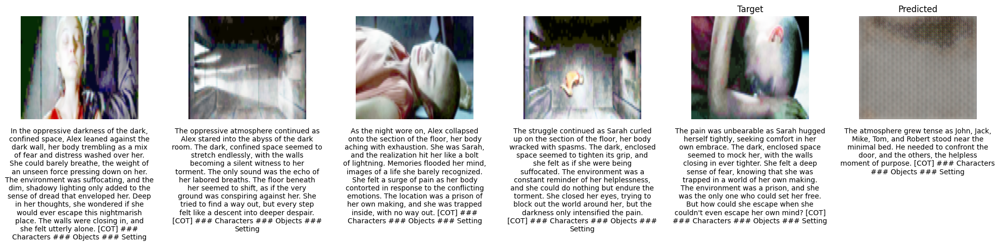

Checkpoint saved to Google Drive: /content/drive/MyDrive/DL_Checkpoints/roberta_clip_checkpoint.pth at epoch 2
Epoch [4/5] Loss: 4.9232 (im=0.621, ctx=0.007, txt=3.048, reid=0.000, g_mse=0.000, nce=0.000, entpool=0.000)


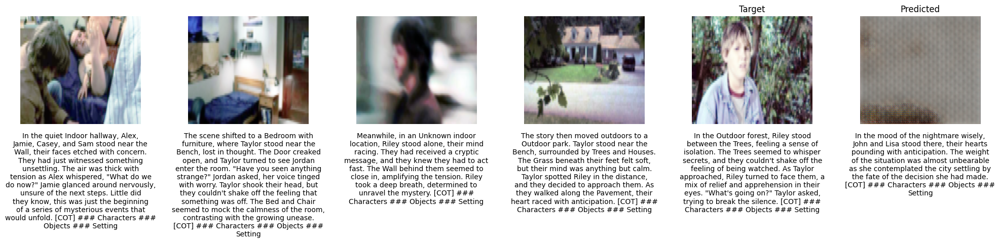

Checkpoint saved to Google Drive: /content/drive/MyDrive/DL_Checkpoints/roberta_clip_checkpoint.pth at epoch 3
Epoch [5/5] Loss: 4.9209 (im=0.651, ctx=0.007, txt=2.972, reid=0.001, g_mse=0.363, nce=0.697, entpool=0.000)


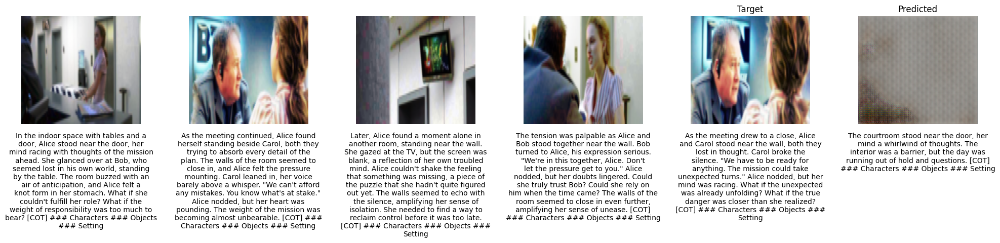

Checkpoint saved to Google Drive: /content/drive/MyDrive/DL_Checkpoints/roberta_clip_checkpoint.pth at epoch 4


In [47]:
# @title Training loop for the sequence predictor
"""
The main training loop:
1. Iterates over epochs and batches.
2. Performs the forward pass to get predictions and latent representations.
3. Computes the **Base Losses**: Image L1, Context MSE, Text CrossEntropy.
4. Computes **CoT Grounding Losses** (if data is valid):
   - `loss_reid`: Visual consistency for re-identified entities.
   - `loss_ground_mse`: Embedding alignment between ROI and text.
   - `loss_contrast`: Contrastive loss for ROI-Text alignment.
   - `loss_entity_pool`: Consistency within the batch for the same entity.
5. Backpropagates total loss and updates weights.
6. Runs the validation visualization at the end of each epoch.
"""

from torch.cuda.amp import autocast, GradScaler
# Instantiate the model, define loss and optimizer

# --- CoT-loss weights (added) ---
LAMBDA_REID = 0.10            # pulls same-entity ROIs together (student idea)
LAMBDA_GROUND_MSE = 0.10      # Option 2: frame-aware ROI↔text MSE grounding
LAMBDA_CONTRAST = 0.10        # Option 1: contrastive ROI↔text grounding (InfoNCE)
LAMBDA_ENTITY_POOL = 0.05     # Option 3: within-batch entity pooling loss
sequence_predictor.to(device)

N_EPOCHS = 5
# Freeze CLIP
for p in sequence_predictor.image_encoder.clip.parameters():
    p.requires_grad = False

for p in sequence_predictor.image_decoder.parameters():
    p.requires_grad = False

sequence_predictor.train()
losses = []

# -----------------------------
# AMP + Grad Accumulation
# -----------------------------

scaler = GradScaler()

ACCUM_STEPS = 4
optimizer.zero_grad()

checkpoint_dir = '/content/drive/MyDrive/DL_Checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)
checkpoint_filename = os.path.join(checkpoint_dir, 'roberta_clip_checkpoint.pth')

start_epoch = 0
if os.path.exists(checkpoint_filename):
    print(f"Loading checkpoint from {checkpoint_filename}")
    sequence_predictor, optimizer, loaded_epoch, _ = load_checkpoint_from_drive(
        sequence_predictor, optimizer,
        filename='roberta_clip_checkpoint.pth'
    )
    start_epoch = loaded_epoch + 1
    print(f"Resuming training from epoch {start_epoch}")

for epoch in range(N_EPOCHS):

    if epoch == 0 and start_epoch == 0:
        print("Unfreezing image decoder...")
        for p in sequence_predictor.image_decoder.parameters():
            p.requires_grad = True

    running_loss = 0.0

    for step, batch in enumerate(train_dataloader):

        frames, image_target, roi1, roi2, roi_valid, roi_frame, ent_id, text_dict, obj_labels = batch

        frames = frames.to(device)
        image_target = image_target.to(device)
        roi1 = roi1.to(device)
        roi2 = roi2.to(device)
        roi_valid = roi_valid.to(device)
        roi_frame = roi_frame.to(device)

        input_ids_roberta = text_dict["input_ids"].to(device)
        attention_mask_roberta = text_dict['attention_mask'].to(device)
        decoder_input_lstm = text_dict["decoder_input_ids"].to(device)
        target_ids_lstm = text_dict["target_ids"].to(device)

        # -----------------------------
        # AMP forward pass
        # -----------------------------
        with autocast():

            pred_image_content, pred_image_context, predicted_text_logits_k, \
            h0_dec, c0_dec, z_v_seq, z_t_seq, attn_weights = sequence_predictor(
                frames,
                input_ids_roberta,
                attention_mask_roberta,
                decoder_input_lstm
            )

            # Resize target safely
            image_target_resized = F.interpolate(
                image_target,
                size=(224, 224),
                mode='bilinear',
                align_corners=False
            )

            loss_im = criterion_images(pred_image_content, image_target_resized)

            # Resize input frames sequence to match pred_image_context resolution (224, 224)
            # frames shape: [B, K, C, H, W] -> flatten B*K to use interpolate
            B_fs, K_fs, C_fs, H_fs, W_fs = frames.shape
            frames_resized = F.interpolate(
                frames.view(B_fs * K_fs, C_fs, H_fs, W_fs),
                size=(224, 224),
                mode='bilinear',
                align_corners=False
            ).view(B_fs, K_fs, C_fs, 224, 224)

            mu_global = frames_resized.mean(dim=[0, 1])
            mu_global = mu_global.unsqueeze(0).expand_as(pred_image_context)
            loss_context = criterion_ctx(pred_image_context, mu_global)

            prediction_flat = predicted_text_logits_k.reshape(-1, tokenizer.vocab_size)
            target_labels = target_ids_lstm.reshape(-1)
            loss_text = criterion_text(prediction_flat, target_labels)

            loss_reid = torch.tensor(0.0, device=device)
            loss_ground_mse = torch.tensor(0.0, device=device)
            loss_contrast = torch.tensor(0.0, device=device)
            loss_entity_pool = torch.tensor(0.0, device=device)

            if roi_valid.any():
                mask = roi_valid.bool()
                if mask.sum() > 0:
                    with torch.no_grad():
                        z_r1_global, _, _, _ = sequence_predictor.image_encoder(roi1[mask])
                        z_r2_global, _, _, _ = sequence_predictor.image_encoder(roi2[mask])

                    z_r1 = z_r1_global
                    z_r2 = z_r2_global

                    loss_reid = F.mse_loss(z_r1, z_r2)

                    if USE_FRAME_AWARE_GROUNDING:
                        z_t_match = z_t_seq[mask]
                        loss_ground_mse = F.mse_loss(z_r1, z_t_match)

                    if USE_CONTRASTIVE_ROI:
                        z_img = F.normalize(z_r1, dim=-1)
                        z_txt = F.normalize(z_t_match, dim=-1)
                        logits = (z_img @ z_txt.t()) / CONTRASTIVE_TAU
                        labels = torch.arange(logits.size(0), device=device)
                        loss_contrast = F.cross_entropy(logits, labels)

            W_IM = 4.0
            W_CTX = 1.0
            W_TXT = 0.7

            loss = (
                W_IM * loss_im +
                W_CTX * loss_context +
                W_TXT * loss_text +
                LAMBDA_REID * loss_reid +
                LAMBDA_GROUND_MSE * loss_ground_mse +
                LAMBDA_CONTRAST * loss_contrast +
                LAMBDA_ENTITY_POOL * loss_entity_pool
            )

            loss = loss / ACCUM_STEPS

        scaler.scale(loss).backward()
        running_loss += loss.item() * ACCUM_STEPS

        if (step + 1) % ACCUM_STEPS == 0:
            from src.final_training import apply_gradient_clipping
            scaler.unscale_(optimizer)
            apply_gradient_clipping(sequence_predictor)
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()

    epoch_loss = running_loss / len(train_dataloader)
    losses.append(epoch_loss)

    print(
        f"Epoch [{epoch+1}/{N_EPOCHS}] Loss: {epoch_loss:.4f} "
        f"(im={loss_im.item():.3f}, ctx={loss_context.item():.3f}, txt={loss_text.item():.3f}, "
        f"reid={float(loss_reid):.3f}, g_mse={float(loss_ground_mse):.3f}, "
        f"nce={float(loss_contrast):.3f}, entpool={float(loss_entity_pool):.3f})"
    )

    validation(sequence_predictor, val_dataloader)
    sequence_predictor.train()

    save_checkpoint_to_drive(
        sequence_predictor, optimizer,
        epoch, epoch_loss,
        filename='roberta_clip_checkpoint.pth'
    )

In [48]:
def plot_loss_curve(losses):
    plt.figure(figsize=(10, 5))
    plt.plot(losses, label='Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Roberta + CLIP FINAL Training Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_metrics(metrics_dict):
    """
    Plots a bar chart for BLEU, ROUGE-L, METEOR, SSIM, and PSNR
    with value labels on top of each bar.
    """
    labels = ['BLEU', 'ROUGE-L', 'METEOR', 'SSIM', 'PSNR']
    values = [
        metrics_dict.get('bleu', 0),
        metrics_dict.get('rougeL', 0),
        metrics_dict.get('meteor', 0),
        metrics_dict.get('ssim', 0),
        metrics_dict.get('psnr', 0)
    ]

    # Ensure values are floats for plotting
    values = [float(v) if hasattr(v, 'item') else v for v in values]

    plt.figure(figsize=(10, 6))
    bars = plt.bar(labels, values, color=['skyblue', 'salmon', 'lightgreen', 'orange', 'plum'])

    # Add exact figures on top of bars
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.4f}',
                 va='bottom', ha='center', fontweight='bold')

    plt.ylabel('Score')
    plt.title('Final Model Experiment Evaluation Metrics')
    # Set ylim slightly higher than max value to fit text
    plt.ylim(0, max(values) * 1.2 if values and max(values) > 0 else 1.0)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

Running final evaluation on test set...


/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.12/dist-packages/nltk/translate/bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


Roberta + CLIP FINAL Metrics: {'text_loss': 3.0858788013458254, 'image_reconstruction_loss': 0.07931947112083435, 'bleu': 0.14942489320729097, 'rougeL': np.float64(0.40911498719374206), 'meteor': np.float64(0.4621476193308821), 'ssim': np.float32(0.23048213), 'mse': np.float32(0.07926036), 'psnr': np.float64(11.075406103001262)}


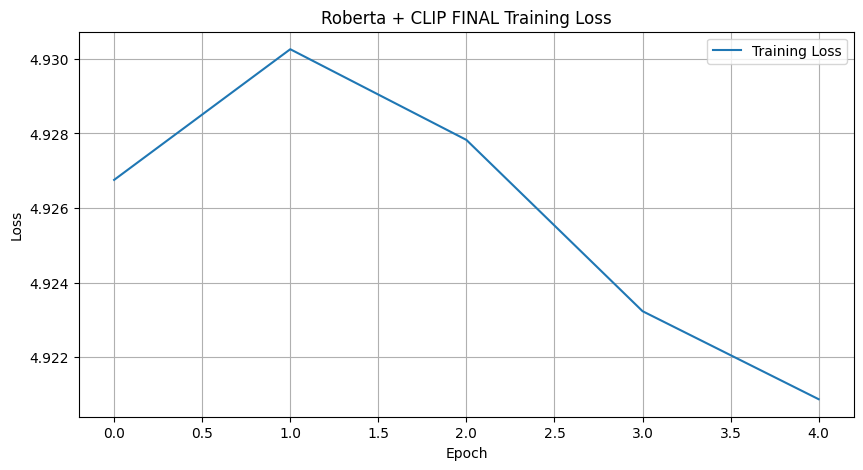

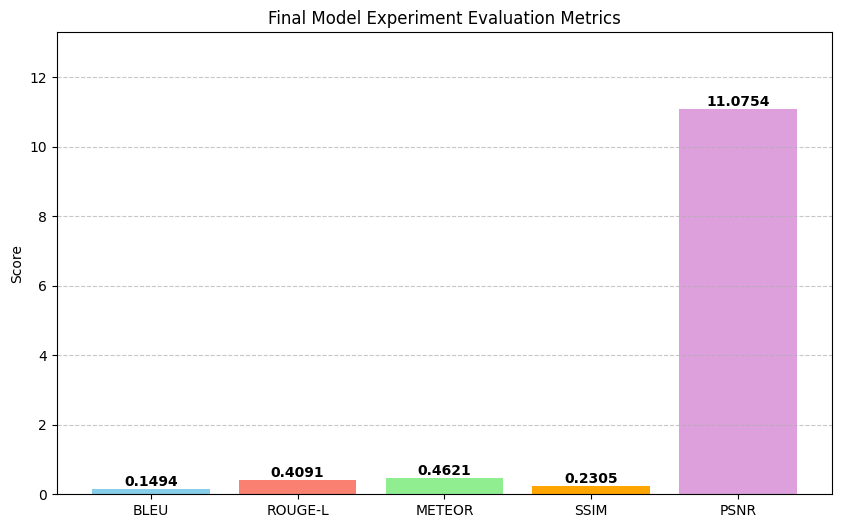

Evaluation complete. Results saved.


In [49]:
print("Running final evaluation on test set...")

baseline_metrics = evaluate_model(sequence_predictor, test_dataloader)
print("Roberta + CLIP FINAL Metrics:", baseline_metrics)

# Convert NumPy types to standard Python floats for JSON serialization
serializable_metrics = {k: float(v) if hasattr(v, 'item') else v for k, v in baseline_metrics.items()}

# Save metrics
with open("Roberta+CLIP_FINAL_results.json", "w") as f:
    json.dump(serializable_metrics, f, indent=4)

# Save table including new metrics
df = pd.DataFrame([{
    "Model": "Roberta+CLIP FINAL",
    "Text_Loss": baseline_metrics["text_loss"],
    "Image_Loss": baseline_metrics["image_reconstruction_loss"],
    "BLEU": baseline_metrics["bleu"],
    "ROUGE-L": baseline_metrics["rougeL"],
    "METEOR": baseline_metrics["meteor"],
    "SSIM": baseline_metrics["ssim"],
    "PSNR": baseline_metrics["psnr"],
    "Number of Epochs": N_EPOCHS,
    "Learning Rate": lr,
    "Batch Size": batch_size,
    "Embedding Dim": emb_dim,
    "Latent Dim": latent_dim,
    "Num Layers": num_layers
}])

df.to_csv("Roberta+CLIP_FINAL_table_and_parameters.csv", index=False)

# Plot curves
if 'losses' in locals():
    plot_loss_curve(losses)

# Use the multi-metric plot
plot_metrics(baseline_metrics)

# Save detailed prediction examples for Figure 3
prediction_examples = get_prediction_examples(sequence_predictor, test_dataloader, n=5)
with open("Roberta+CLIP_FINAL_prediction_examples.json", "w") as f:
    json.dump(prediction_examples, f, indent=4)

print("Evaluation complete. Results saved.")

In [58]:
print(attn_weights.shape)

torch.Size([9, 4])


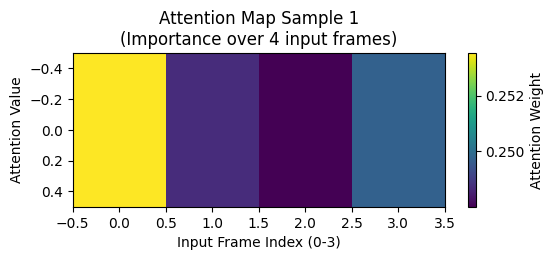

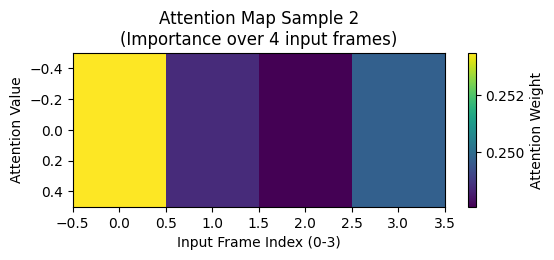

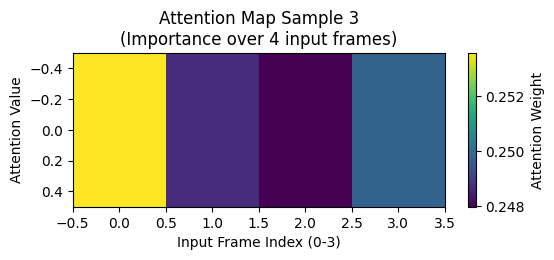

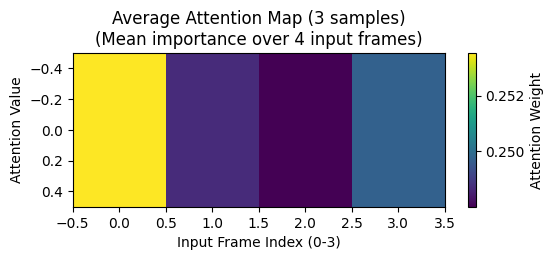

In [59]:
# Plot attention / explainability maps for Figure 4
plot_attention_heatmaps(sequence_predictor, test_dataloader, device)


📊 Attention Table (10 samples × 4 inputs)


,Input_0,Input_1,Input_2,Input_3
0,0.251364,0.248798,0.248952,0.250885
1,0.251334,0.248800,0.248982,0.250884
2,0.251398,0.248773,0.248902,0.250928
3,0.251276,0.248735,0.249109,0.250881
4,0.251374,0.248793,0.248970,0.250863
5,0.251338,0.248803,0.248941,0.250917
6,0.251263,0.248894,0.248974,0.250869
7,0.251372,0.248803,0.248930,0.250895
8,0.251387,0.248746,0.248947,0.250921
9,0.251342,0.248731,0.249039,0.250888


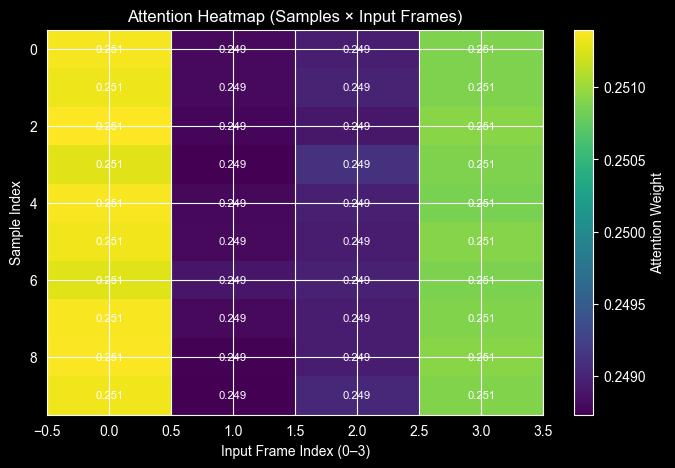

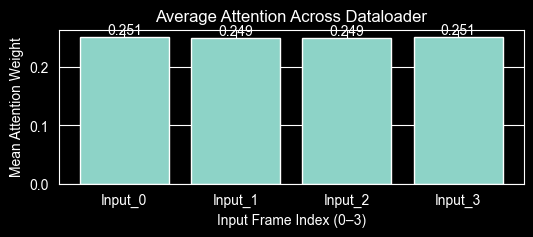

In [49]:
# Plot attention / explainability maps for Text
plot_attention_heatmap_text(sequence_predictor, test_dataloader, device)

### Explainability and Visual Diagnostics
Running the visual and cross-modal alignment tools.

In [40]:
sequence_predictor.image_encoder.clip.vision_model.config._attn_implementation = "eager"

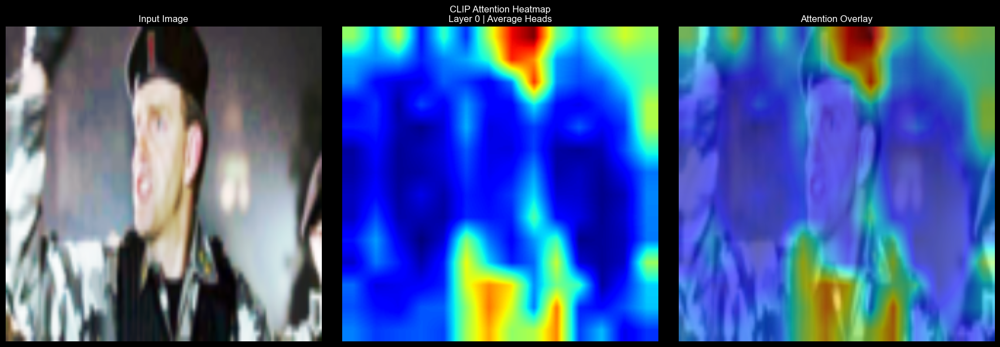

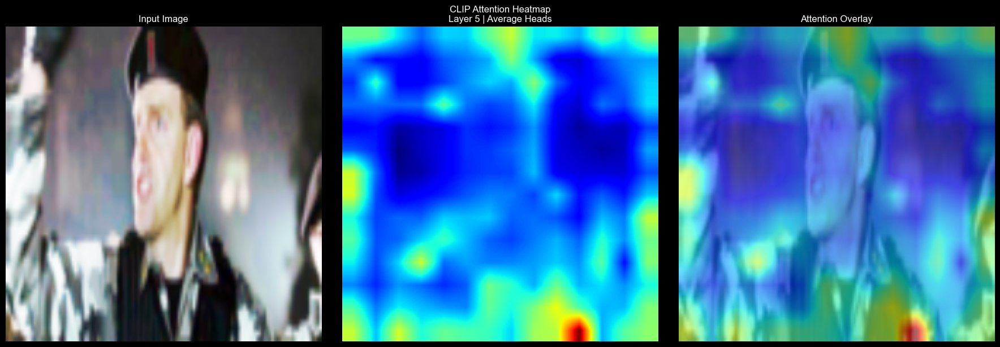

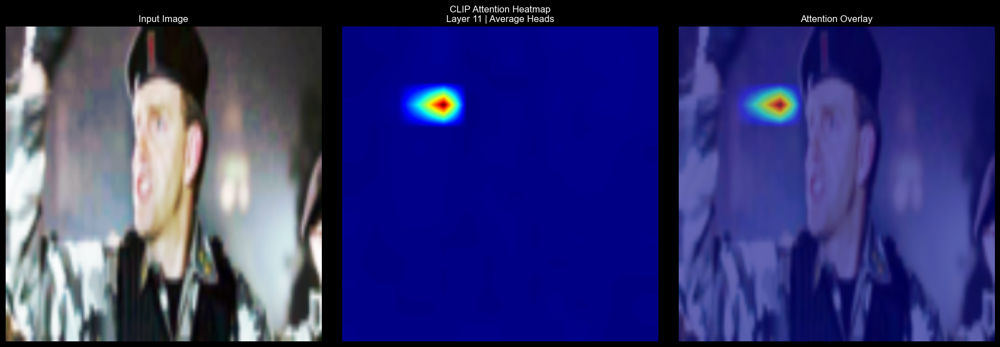

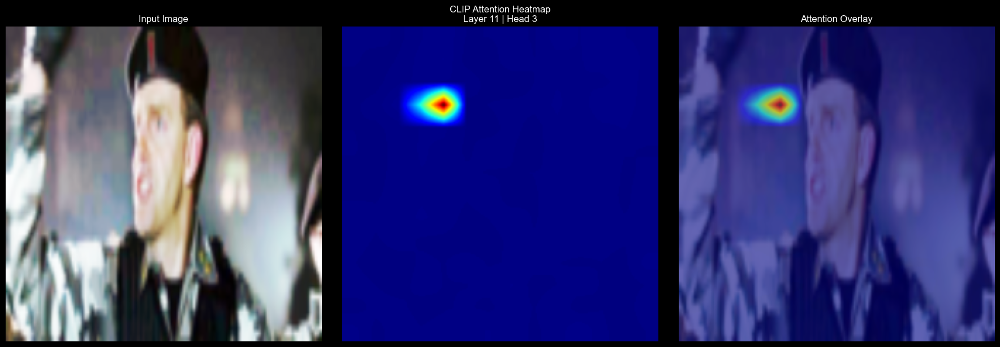

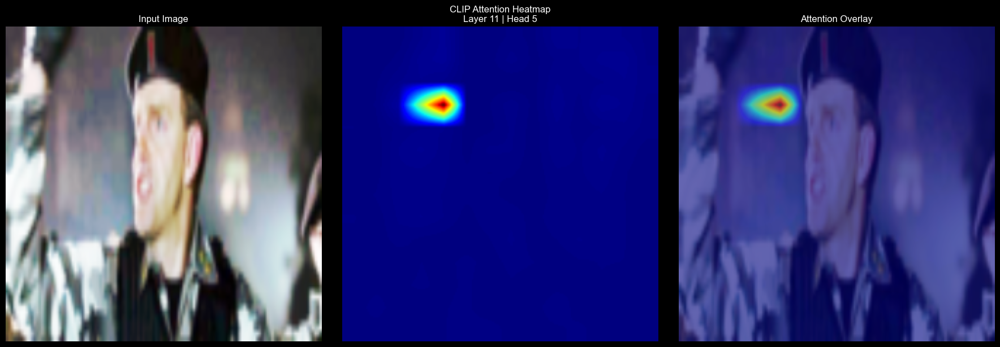

In [43]:
plot_feature_maps(sequence_predictor, test_dataloader, device, layer_id=0)

plot_feature_maps(sequence_predictor, test_dataloader, device, layer_id=5)

plot_feature_maps(sequence_predictor, test_dataloader, device, layer_id=11)

plot_feature_maps(sequence_predictor, test_dataloader, device, layer_id=11, head=3)
plot_feature_maps(sequence_predictor, test_dataloader, device, layer_id=11, head=5)

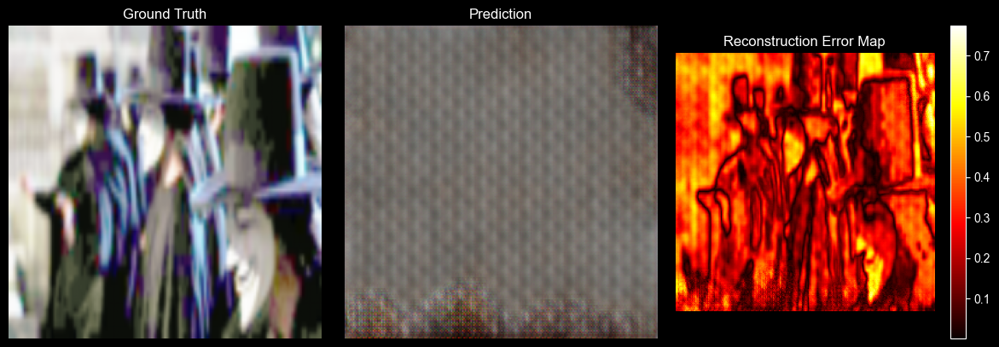

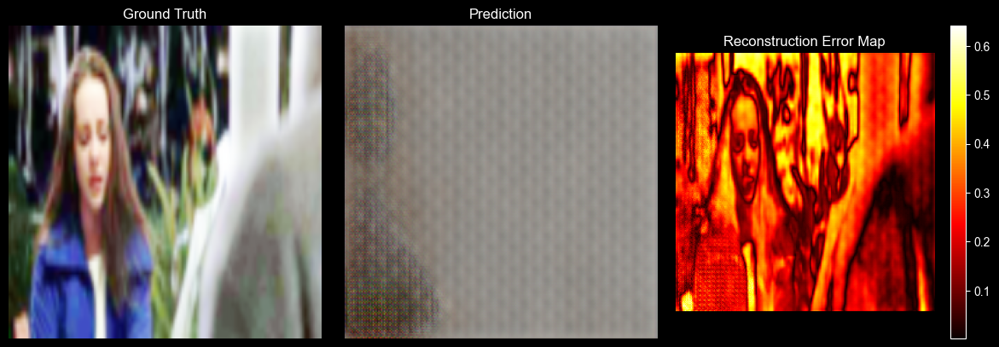

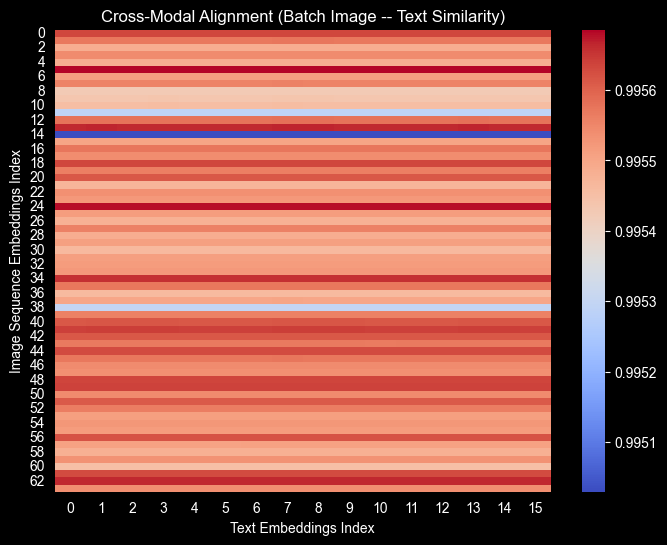

In [46]:
# 1. Visual Reconstruction Error
plot_reconstruction_error_maps(sequence_predictor, test_dataloader, device, n_samples=2)

# 2. Cross-Modal Alignment Analysis
plot_cross_modal_alignment(sequence_predictor, test_dataloader, device)

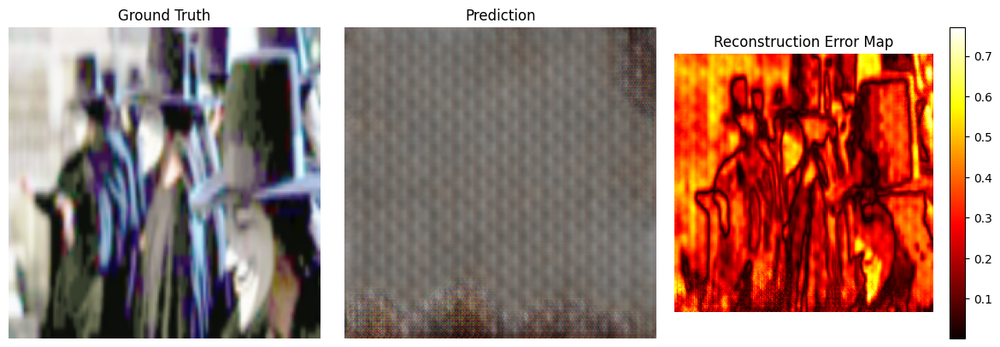

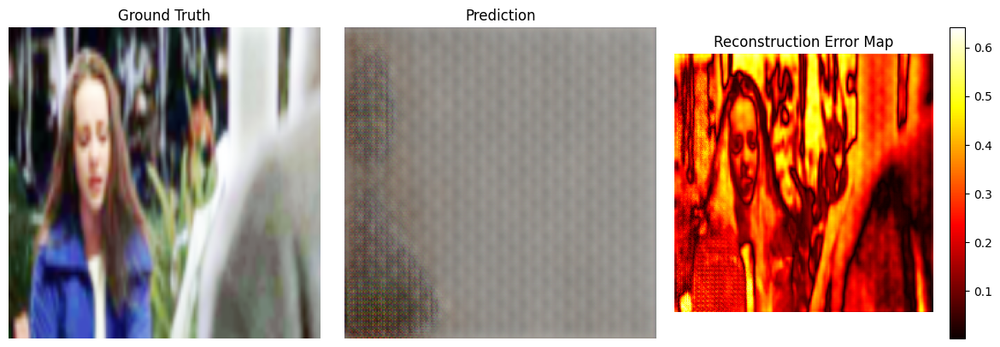

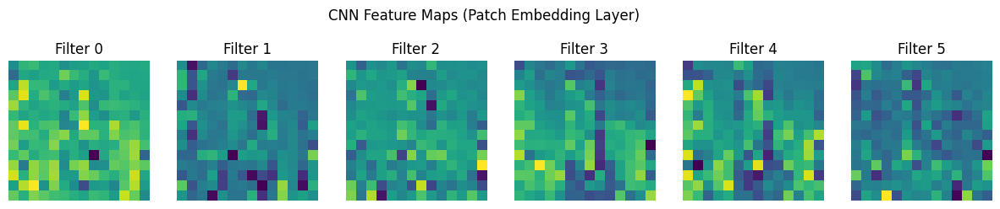

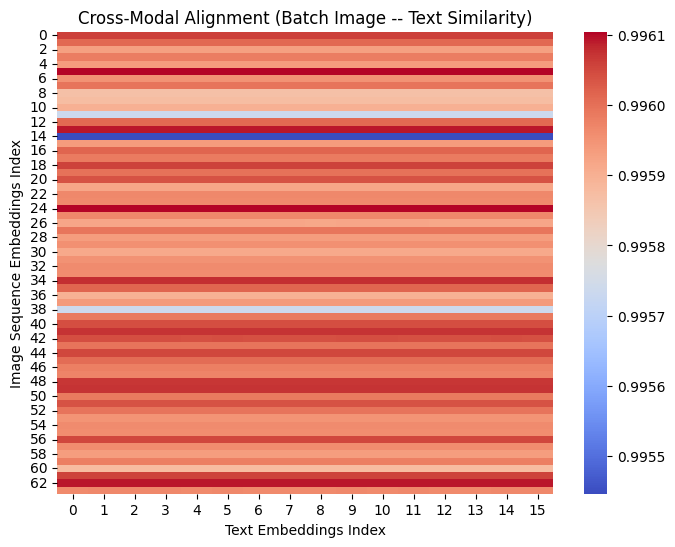

In [52]:
# 1. Visual Reconstruction Error
plot_reconstruction_error_maps(sequence_predictor, test_dataloader, device, n_samples=2)

# 2. Cross-Modal Alignment Analysis
plot_cross_modal_alignment(sequence_predictor, test_dataloader, device)

In [2]:
with open("Roberta+CLIP_FINAL_prediction_examples.json") as f:
    examples = json.load(f)


In [3]:
def show_full_example(example):
    frames = np.array(example["input_frames"])
    gt_img = np.array(example["ground_truth_image"])
    pred_img = np.array(example["predicted_image"])

    fig, axes = plt.subplots(2, 4, figsize=(12,6))

    # Input frames
    for i in range(4):
        img = frames[i].transpose(1,2,0)
        axes[0,i].imshow(img)
        axes[0,i].axis('off')
        axes[0,i].set_title(f"Input {i+1}")

    # Ground truth image
    gt_img = gt_img.transpose(1,2,0)
    axes[1,1].imshow(gt_img)
    axes[1,1].set_title("Ground Truth Image")
    axes[1,1].axis('off')

    # Predicted image
    pred_img = pred_img.transpose(1,2,0)
    axes[1,2].imshow(pred_img)
    axes[1,2].set_title("Predicted Image")
    axes[1,2].axis('off')

    # Hide unused plots
    axes[1,0].axis('off')
    axes[1,3].axis('off')

    plt.tight_layout()
    plt.show()

    print("\n--- TEXT ---")
    print("Ground Truth:\n", example["ground_truth_text"])
    print("\nPrediction:\n", example["predicted_text"])


=== Example 1 ===


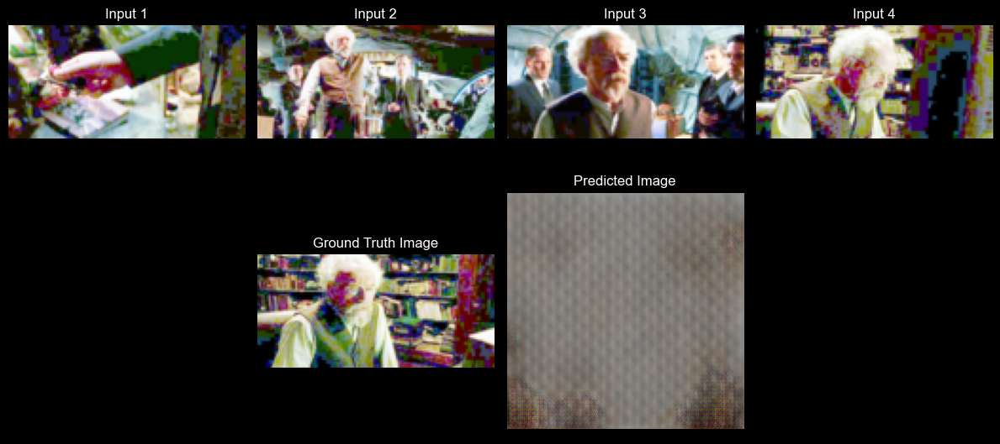


--- TEXT ---
Ground Truth:
 The scene continued in the library, where William remained seated in a chair. His gaze shifted from the books on the shelf to the A dark, shadowy area in the background. The A book, A book, and A book seemed to call out to him, their secrets waiting to be uncovered. William felt a sense of urgency as he realized that time was running out. The suspense of the unfolding drama reached a boiling point as William decided to take action. With a sense of determination, he reached for one of the books on the shelf, ready to unlock the mysteries that lay within. [

Prediction:
 The tension shifted to the room, the the stood focused, the different, The eyes was, the window, the table, the scene room and the the, the background. The wall wall on and man, and the man, to be the to the, and presence that to be.. [, a sense of urgency, he realized that the was running out. The tension was the room drama was its boiling point, the and to take action. The a deep of urgency

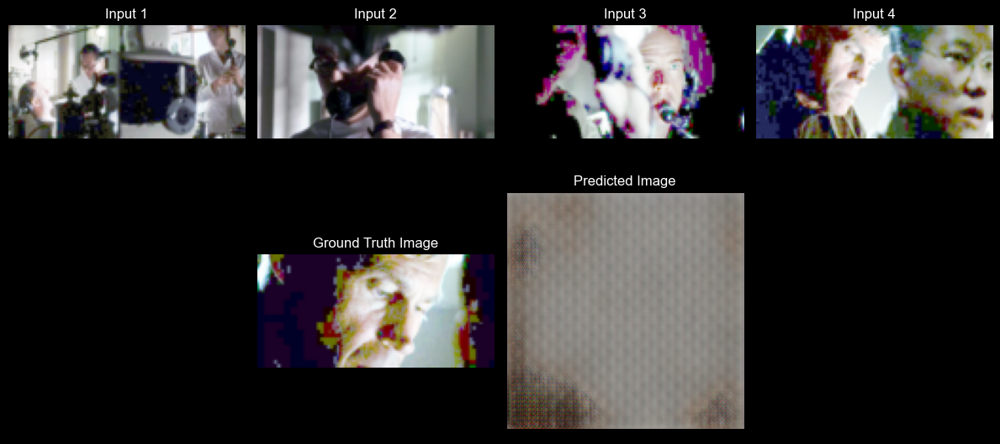


--- TEXT ---
Ground Truth:
 Jack stood alone in the room, the wall behind him feeling like a barrier between him and the outside world. The wall to his right seemed to mock him, reminding him of the isolation he felt. Jack took a deep breath, trying to gather his thoughts. He knew that he had to find a way out of this mess. [COT] ### Characters ### Objects ### Setting

Prediction:
 The, in, the room, the tension and her seemed like a prison. him and the truth world. The tension behind the tie was to close him, a him of the challenges he felt. [ felt a deep breath, steel to calm his thoughts. The knew that the had to find a way to, this situation, [COT] ### Characters ### Objects ### Setting over over over.....,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,

=== Example 3 ===


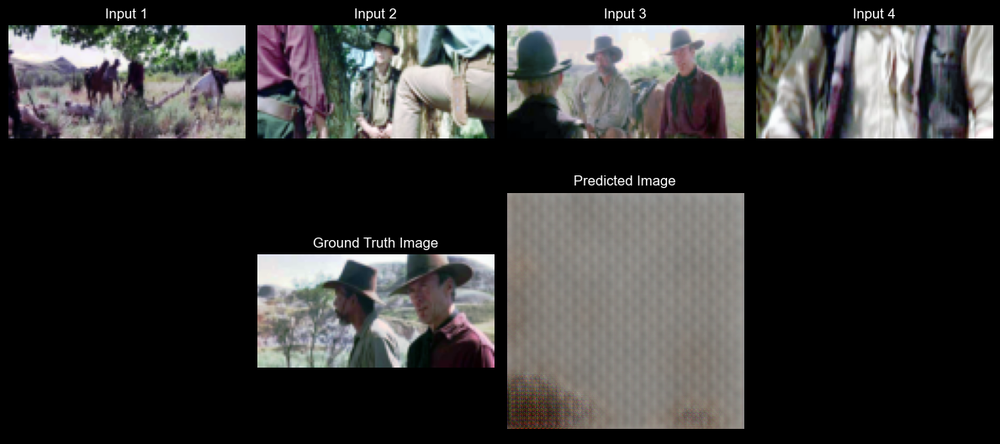


--- TEXT ---
Ground Truth:
 In the open field with mountains, Peter and Michael stood together, listening intently to the sounds of the wilderness. The mountain loomed in the background, a silent witness to their conversation. Peter, with his neutral expression, observed the land, while Michael listened with interest. The rural area was peaceful, yet the air was thick with unspoken tension. Both they knew that the mission ahead was fraught with danger, and they needed to be prepared for anything. [COT] ### Characters ### Objects ### Setting

Prediction:
 The the dim area, a, the stood the stood near, their intently. the scene. the situation. The room inomed in the background, a silent witness to the conversation. The, a his tie expression, stood the scene, his the stood int a. The walls environment with a, but the tension was thick with tensionspoken words. [ and were that the truth was would far with danger, and he knew to find careful for the. [COT] ### Characters ### Objects ### Se

In [4]:
for idx, example in enumerate(examples[2:]): # thelast 2
    print(f"\n=== Example {idx+1} ===")
    show_full_example(example)